In [26]:
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from hyperopt import fmin, tpe, hp, Trials, space_eval
from sklearn.metrics import mean_squared_error
from util import evaluate, plot_importance, plot_history
from sklearn.model_selection import train_test_split#安装库运行环境先百度清华镜像，清华镜像下载速度较快

In [27]:
data = pd.read_csv(r"G:\数据准备\12个城市外国PM2.5-网格形式\7个超大城市范围\北京市分区csv\北京市1_matched.csv")

In [28]:
cols = ['dengguang', 'gdp']#选择的自变量
X = data[cols]
y = data['value']

In [29]:
X

,dengguang,gdp
0,23.539309,118852.678
1,12.259013,118852.678
2,14.741382,118852.678
3,19.690012,118852.678
4,33.291542,118852.678
...,...,...
932,23.539309,118852.678
933,10.871409,41019.000
934,23.539309,5128.000
935,7.356850,118852.678


In [30]:
y

0      38.299999
1      38.599998
2      38.900002
3      38.799999
4      38.700001
         ...    
932    40.400002
933    41.099998
934    40.900002
935    41.299999
936    41.599998
Name: value, Length: 937, dtype: float64

In [31]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)#总数据分出0.2测试集和0.8训练集

In [32]:
X_train,X_valid,y_train,y_valid = train_test_split(X_train,y_train,test_size=0.2,random_state=42)#0.8的训练集分成0.2的训练集和0.8测试集

In [33]:
print('训练集大小:',X_train.shape[0])
print('测试集大小:',X_test.shape[0])
print('验证集大小:',X_valid.shape[0])

训练集大小: 599
测试集大小: 188
验证集大小: 150


In [34]:
param_space = {
    "max_depth": hp.choice("max_depth", np.linspace(1, 10, 10, dtype=int)),#2是最小，10是最大，9是分9份。此参数为学习深度默认值6典型最终值3-10
    "gamma": hp.choice("gamma", np.linspace(0.01, 1, 10)),#默认值为0使算法保守根据损失函数变化进行调整
    "n_estimators": hp.choice("n_estimators", np.linspace(1, 500, 500, dtype=int)),#最后是分多少份，迭代可以增加平线长度使得测试集和训练集更加贴近，老师修改的4000
    "colsample_bytree": hp.choice("colsample_bytree", np.linspace(0.5, 1, 10)),#减慢学习速度方法通过子样本和这个减少样本数和特征，让数值更小典型最终值0.5-1
    "subsample": hp.quniform("subsample", 0.5, 0.7, 0.1),#使算法更加保守，防治过拟合，太小的值会欠拟合。典型最终值0.5-1
    "eta": hp.uniform("eta", 0.01, 0.2),#学习率可以放慢学习速度，限制集合中每棵树的贡献默认值0.3，可以尝试较小的值0.01，典型最终值0.01-0.2
    "objective": "reg:squarederror",
    "eval_metric": "rmse",
    "random_state": 0
}

In [35]:
def score(params):
    model = xgb.XGBRegressor(**params)
    model.fit(X_train, y_train,#可以修改为训练集、测试集、验证集，寻找最佳参数的某个值
              eval_set=[(X_train, y_train), (X_valid, y_valid)],
              early_stopping_rounds=10,
              verbose=False)
    y_pred = model.predict(X_valid)
    score = mean_squared_error(y_valid, y_pred)
    return {"loss": score, "status": "ok"}

In [36]:
trials = Trials()
best_params_loc = fmin(score, param_space, algo=tpe.suggest, max_evals=50, trials=trials)
optimal_params = space_eval(param_space, best_params_loc)

  4%|▍         | 2/50 [00:00<00:03, 14.07trial/s, best loss: 3.880541154129672]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 12%|█▏        | 6/50 [00:00<00:02, 16.88trial/s, best loss: 3.13952931533467] 

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 16%|█▌        | 8/50 [00:00<00:04, 10.37trial/s, best loss: 3.13952931533467]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 20%|██        | 10/50 [00:00<00:03, 12.10trial/s, best loss: 3.13952931533467]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in co

 30%|███       | 15/50 [00:01<00:02, 15.29trial/s, best loss: 3.13952931533467]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in co

 38%|███▊      | 19/50 [00:01<00:02, 13.23trial/s, best loss: 3.13952931533467]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 46%|████▌     | 23/50 [00:01<00:01, 15.32trial/s, best loss: 3.13952931533467]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in co

 50%|█████     | 25/50 [00:01<00:01, 13.89trial/s, best loss: 3.13952931533467]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in co

 58%|█████▊    | 29/50 [00:02<00:01, 10.90trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 66%|██████▌   | 33/50 [00:02<00:01, 10.72trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 70%|███████   | 35/50 [00:02<00:01,  9.89trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 74%|███████▍  | 37/50 [00:03<00:01, 10.26trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 82%|████████▏ | 41/50 [00:03<00:00, 11.54trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 86%|████████▌ | 43/50 [00:03<00:00, 12.71trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 94%|█████████▍| 47/50 [00:03<00:00, 12.89trial/s, best loss: 3.114003578848649]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in co

100%|██████████| 50/50 [00:04<00:00, 12.36trial/s, best loss: 3.114003578848649]


C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



In [37]:
optimal_params#输出最佳参数

{'colsample_bytree': 1.0,
 'eta': 0.05554649573286372,
 'eval_metric': 'rmse',
 'gamma': 0.12,
 'max_depth': 5,
 'n_estimators': 350,
 'objective': 'reg:squarederror',
 'random_state': 0,
 'subsample': 0.7000000000000001}

# Fit on entire train and evaluate on test set

In [38]:
X_train = pd.concat([X_train, X_valid])
y_train = pd.concat([y_train, y_valid])

In [39]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [40]:
model = xgb.XGBRegressor(**optimal_params)
model.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_test, y_test), (X_valid, y_valid)],
    early_stopping_rounds=10,
    verbose=True
)

[0]	validation_0-rmse:2.77608	validation_1-rmse:2.84529	validation_2-rmse:2.83070
[1]	validation_0-rmse:2.70256	validation_1-rmse:2.77651	validation_2-rmse:2.74521
[2]	validation_0-rmse:2.63054	validation_1-rmse:2.71666	validation_2-rmse:2.66517
[3]	validation_0-rmse:2.56496	validation_1-rmse:2.64850	validation_2-rmse:2.59069
[4]	validation_0-rmse:2.50453	validation_1-rmse:2.59266	validation_2-rmse:2.52392
[5]	validation_0-rmse:2.45033	validation_1-rmse:2.54318	validation_2-rmse:2.45541
[6]	validation_0-rmse:2.39551	validation_1-rmse:2.49259	validation_2-rmse:2.39245
[7]	validation_0-rmse:2.34425	validation_1-rmse:2.44455	validation_2-rmse:2.33859
[8]	validation_0-rmse:2.30024	validation_1-rmse:2.40750	validation_2-rmse:2.29003
[9]	validation_0-rmse:2.25494	validation_1-rmse:2.37650	validation_2-rmse:2.24825
[10]	validation_0-rmse:2.21676	validation_1-rmse:2.34486	validation_2-rmse:2.20750
[11]	validation_0-rmse:2.18083	validation_1-rmse:2.31630	validation_2-rmse:2.16315
[12]	validatio

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-rmse:1.77044	validation_1-rmse:2.07997	validation_2-rmse:1.74123
[35]	validation_0-rmse:1.76095	validation_1-rmse:2.08177	validation_2-rmse:1.73602
[36]	validation_0-rmse:1.75286	validation_1-rmse:2.07768	validation_2-rmse:1.72740
[37]	validation_0-rmse:1.74627	validation_1-rmse:2.07771	validation_2-rmse:1.72389
[38]	validation_0-rmse:1.74200	validation_1-rmse:2.07541	validation_2-rmse:1.72221
[39]	validation_0-rmse:1.73461	validation_1-rmse:2.07271	validation_2-rmse:1.71211
[40]	validation_0-rmse:1.72755	validation_1-rmse:2.07619	validation_2-rmse:1.70849
[41]	validation_0-rmse:1.72464	validation_1-rmse:2.07596	validation_2-rmse:1.70660
[42]	validation_0-rmse:1.71630	validation_1-rmse:2.07174	validation_2-rmse:1.69417
[43]	validation_0-rmse:1.71011	validation_1-rmse:2.07097	validation_2-rmse:1.68769
[44]	validation_0-rmse:1.69980	validation_1-rmse:2.07422	validation_2-rmse:1.67377
[45]	validation_0-rmse:1.69253	validation_1-rmse:2.07099	validation_2-rmse:1.66714
[46]

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, device=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.05554649573286372,
             eval_metric='rmse', feature_types=None, gamma=0.12,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=350, n_jobs=None,
             num_parallel_tree=None, ...)

In [42]:
Z = model.predict(data[cols])

xx = np.zeros(shape=(937,2))
xx[:,0]=data['value'].values
xx[:,1]=Z
np.savetxt('XGB.csv', xx, delimiter = ',') 

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 0.6803758255856245
MSE = 0.9999009987616861
RMSE = 0.9999504981556268
MAPE = 0.018080410802827997
R^2 = 0.8772721597169963
Explained Variance Score = 0.877272788391566

Residuals summary stats
╒═══════╤═════════════╕
│ count │         655 │
├───────┼─────────────┤
│ mean  │ -0.00226318 │
├───────┼─────────────┤
│ std   │     1.00071 │
├───────┼─────────────┤
│ min   │    -5.05782 │
├───────┼─────────────┤
│ 25%   │   -0.502422 │
├───────┼─────────────┤
│ 50%   │  -0.0528793 │
├───────┼─────────────┤
│ 75%   │    0.446987 │
├───────┼─────────────┤
│ max   │     5.54218 │
╘═══════╧═════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  79.084  │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  96.1832 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  97.8626 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-

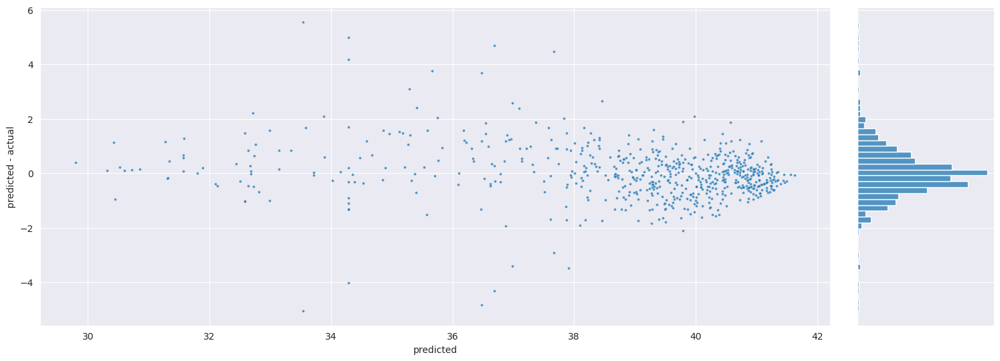

<Figure size 1000x800 with 0 Axes>

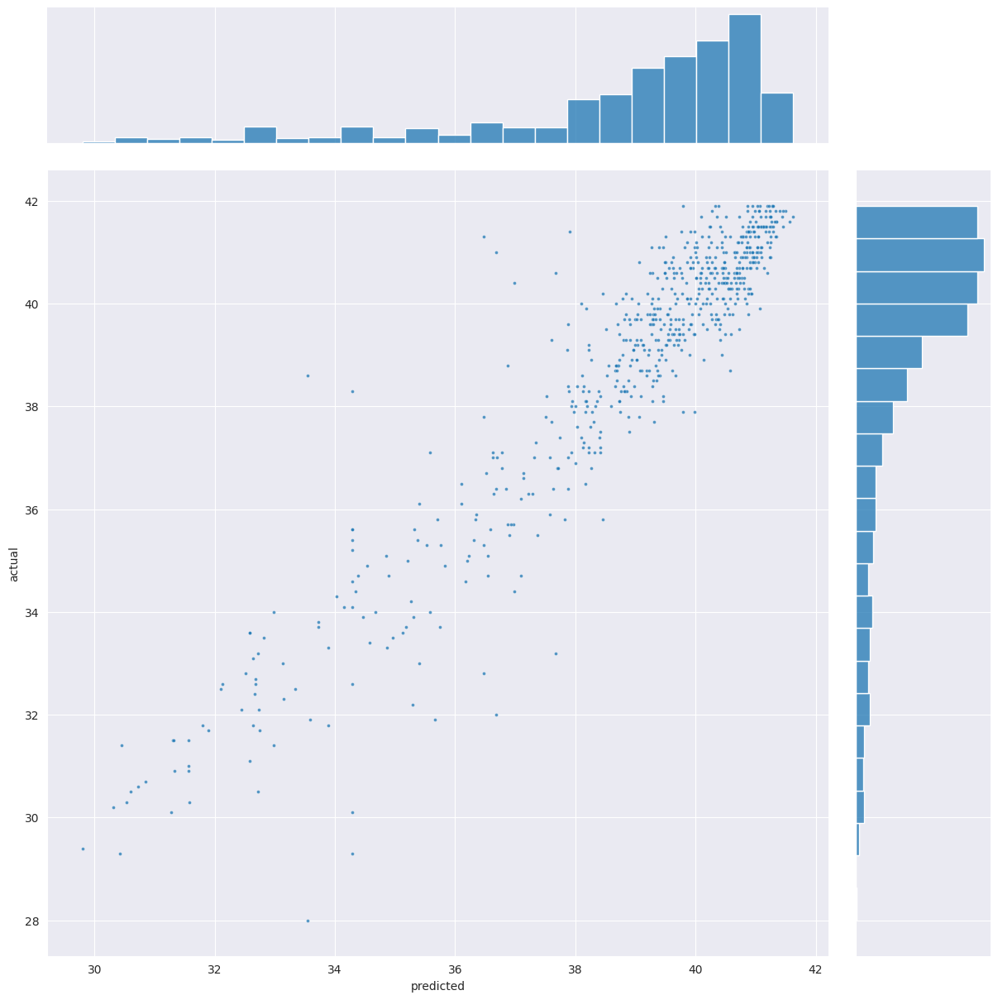

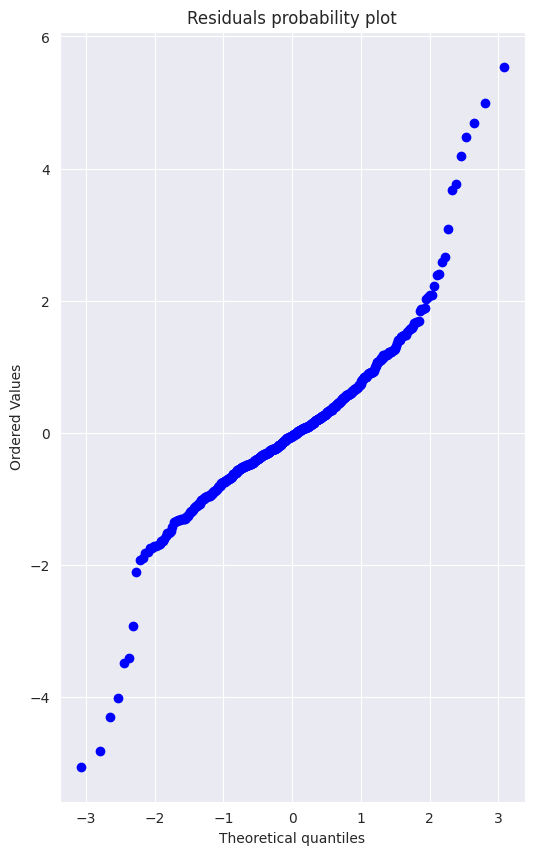

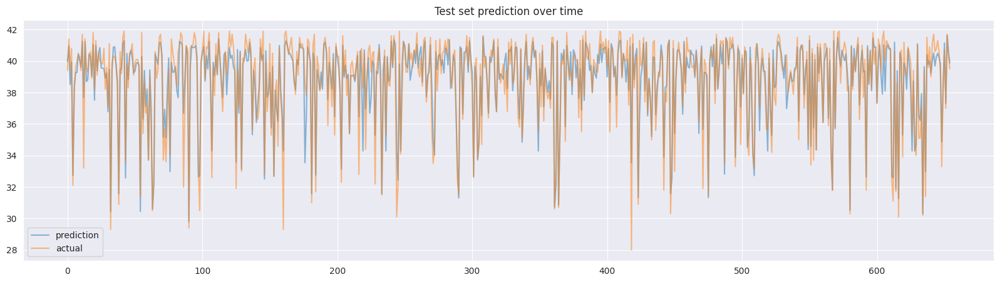

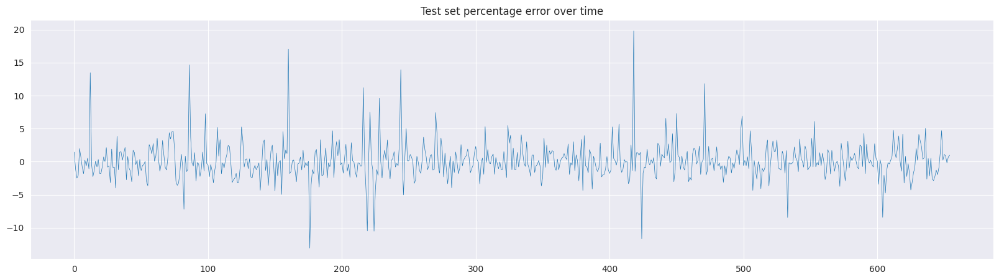

In [43]:
y_train_pred = model.predict(X_train)
evaluate(y_train.to_numpy(), y_train_pred)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 0.8488979339346029
MSE = 1.5221527995355597
RMSE = 1.2337555671751028
MAPE = 0.022642059725889424
R^2 = 0.8207781026527674
Explained Variance Score = 0.8207840959140841

Residuals summary stats
╒═══════╤════════════╕
│ count │        150 │
├───────┼────────────┤
│ mean  │ 0.00713453 │
├───────┼────────────┤
│ std   │    1.23787 │
├───────┼────────────┤
│ min   │   -5.86636 │
├───────┼────────────┤
│ 25%   │  -0.606143 │
├───────┼────────────┤
│ 50%   │ -0.0651951 │
├───────┼────────────┤
│ 75%   │   0.597066 │
├───────┼────────────┤
│ max   │    4.98833 │
╘═══════╧════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  79.3333 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  95.3333 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  97.3333 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-Bera Test on Res

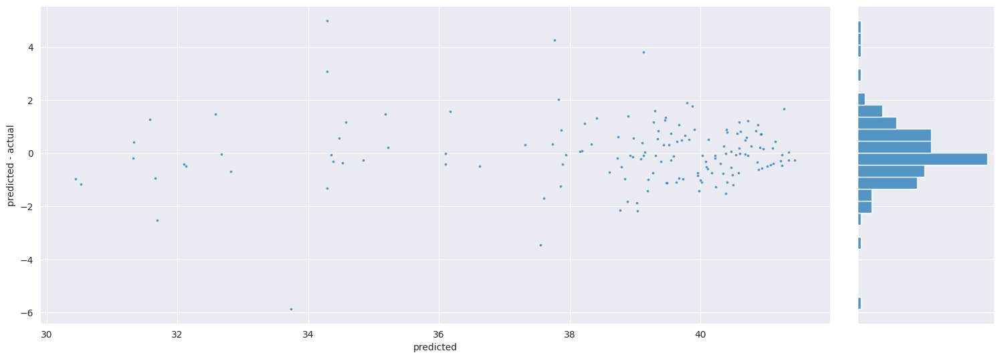

<Figure size 1000x800 with 0 Axes>

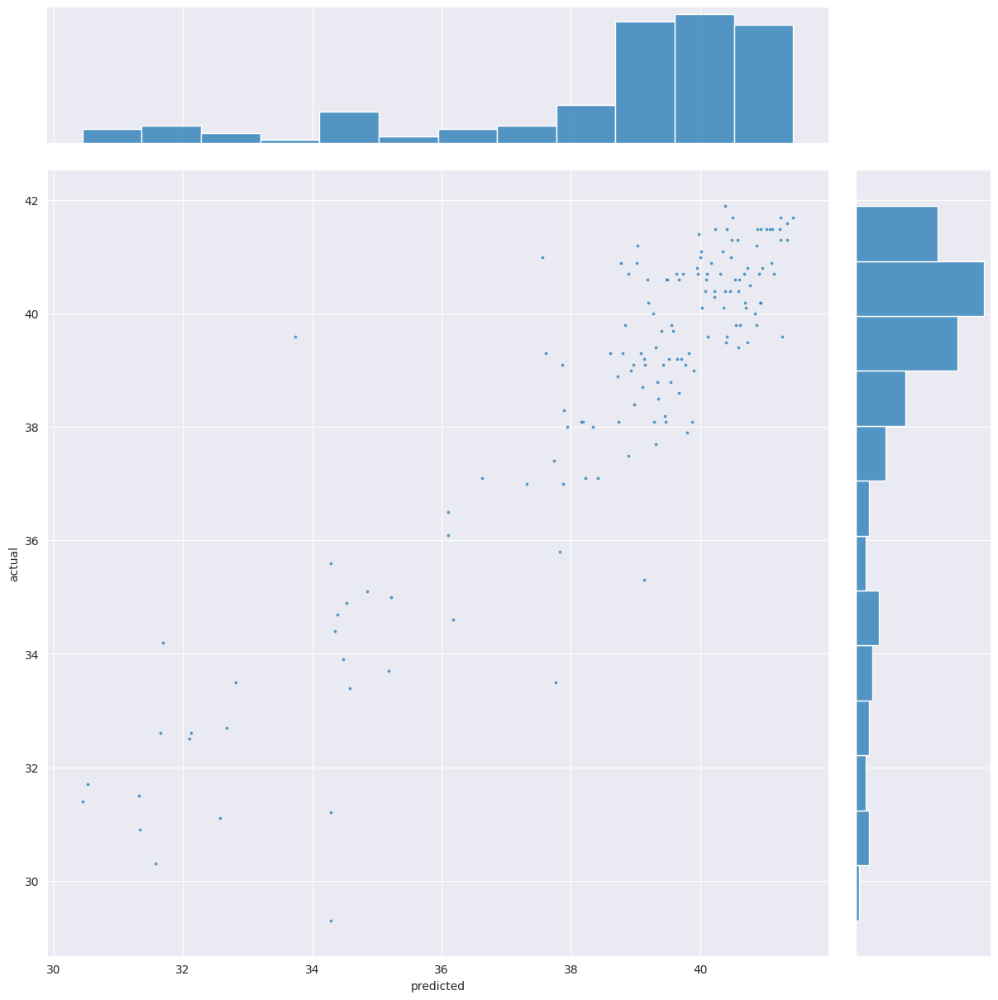

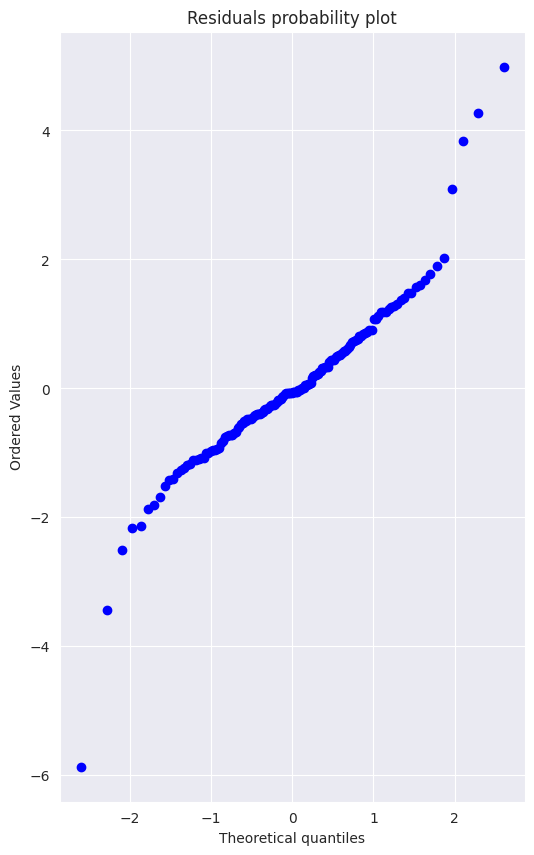

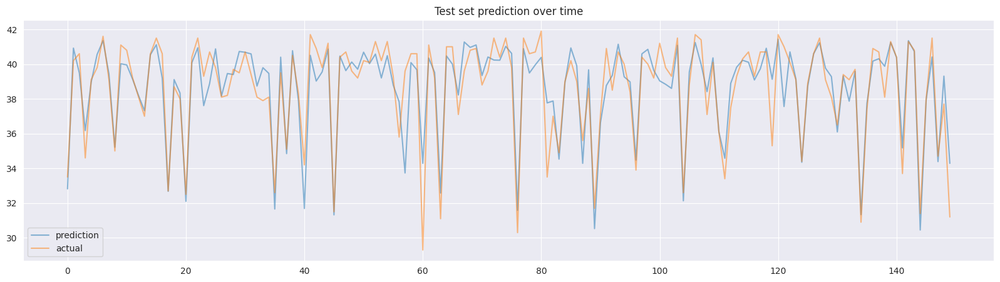

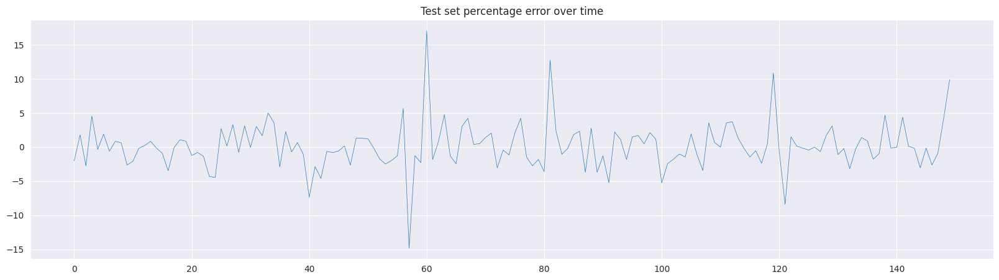

In [44]:
y_valid_pred = model.predict(X_valid)
evaluate(y_valid.to_numpy(), y_valid_pred)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 1.627322873363946
MSE = 5.3734179085669735
RMSE = 2.3180633961492454
MAPE = 0.04333618829125127
R^2 = 0.3715163113736526
Explained Variance Score = 0.380839925423738

Residuals summary stats
╒═══════╤═══════════╕
│ count │       282 │
├───────┼───────────┤
│ mean  │ -0.282339 │
├───────┼───────────┤
│ std   │    2.3049 │
├───────┼───────────┤
│ min   │  -7.41167 │
├───────┼───────────┤
│ 25%   │   -1.3651 │
├───────┼───────────┤
│ 50%   │ -0.299244 │
├───────┼───────────┤
│ 75%   │  0.705301 │
├───────┼───────────┤
│ max   │   11.6589 │
╘═══════╧═══════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  79.4326 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  94.3262 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  98.5816 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-Bera Test on Residuals
╒════════════

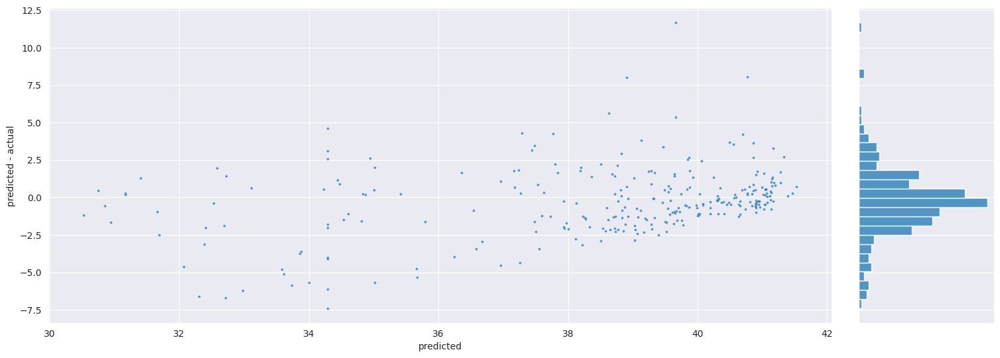

<Figure size 1000x800 with 0 Axes>

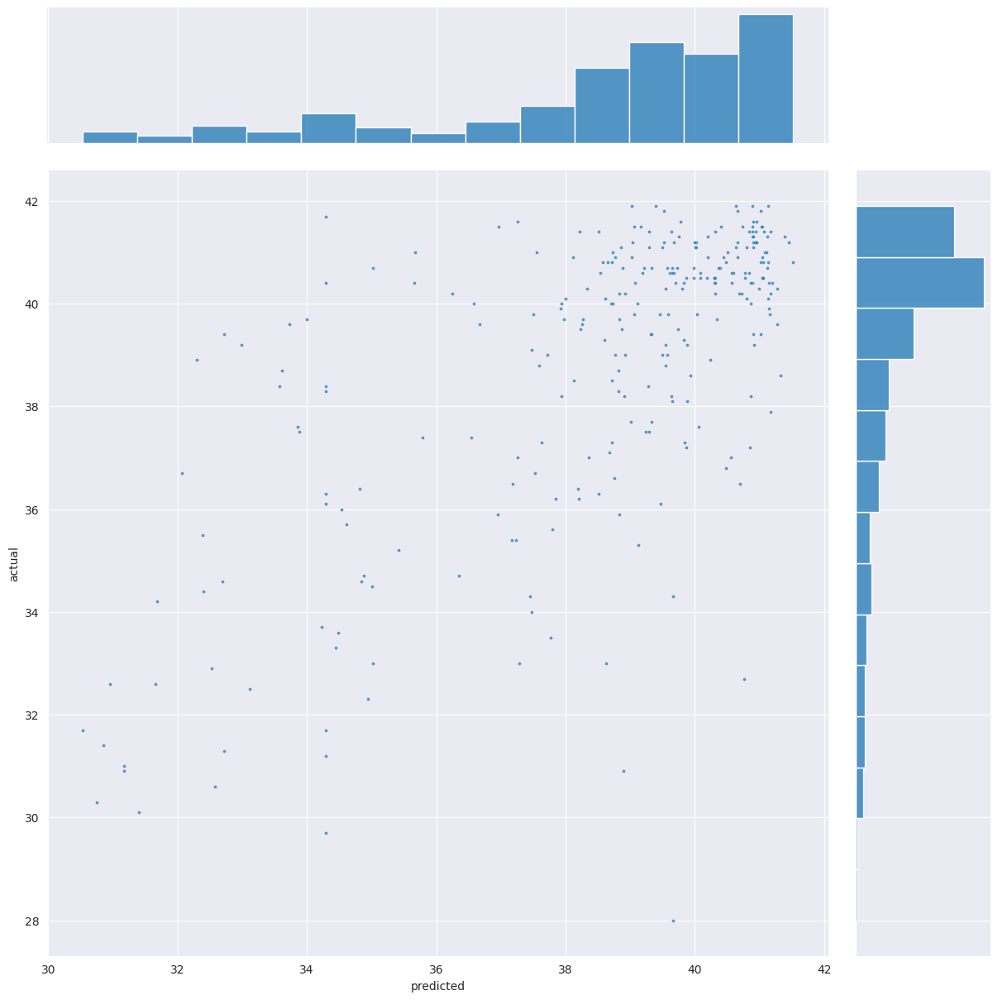

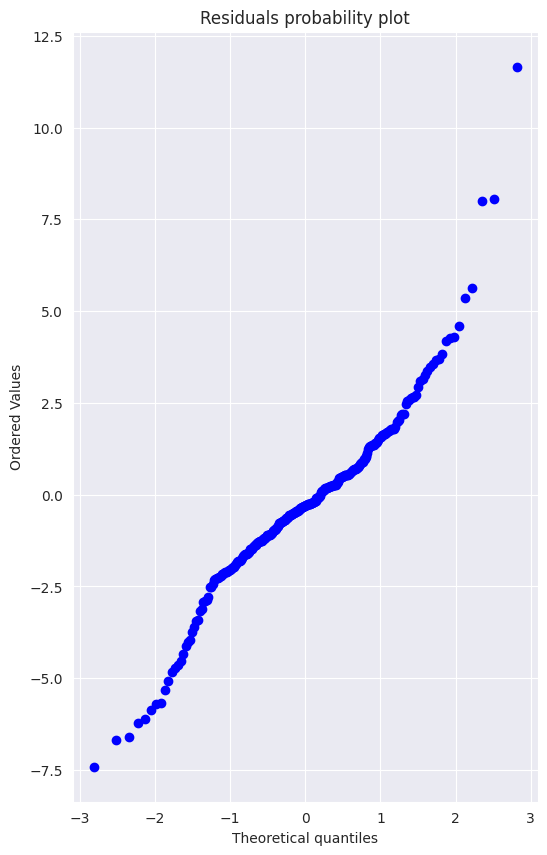

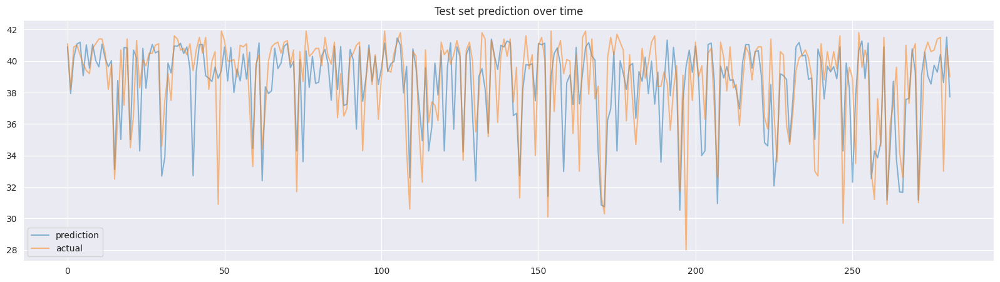

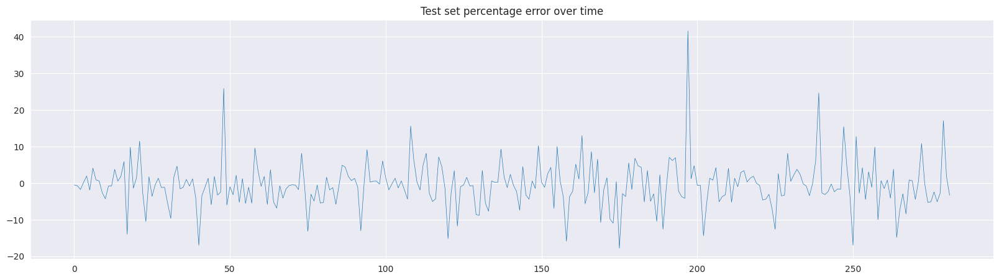

In [45]:
y_pred = model.predict(X_test)
evaluate(y_test.to_numpy(), y_pred)

In [46]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
# define an additional metric 
def MAPE(true, pred):
    diff = np.abs(np.array(true) - np.array(pred))
    return np.mean(diff / abs(true))

In [47]:
print("Training R2:", r2_score(y_train, y_train_pred), "traing RMSE:", np.sqrt(mean_squared_error(y_train, y_train_pred)), "training MAE:", mean_absolute_error(y_train, y_train_pred), "MAPE:", MAPE(y_train, y_train_pred)*100,"%")

Training R2: 0.8772721597169963 traing RMSE: 0.9999504981556268 training MAE: 0.6803758255856245 MAPE: 1.8080410802827998 %


In [48]:
print("Testing R2:", r2_score(y_test, y_pred), "Testing RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)), "Testing MAE:", mean_absolute_error(y_test, y_pred), "MAPE:", MAPE(y_test, y_pred)*100,"%")

Testing R2: 0.3715163113736526 Testing RMSE: 2.3180633961492454 Testing MAE: 1.627322873363946 MAPE: 4.333618829125127 %


In [49]:
print("Valid R2:", r2_score( y_valid, y_valid_pred), "valid RMSE:", np.sqrt(mean_squared_error(y_valid, y_valid_pred)), "Testing MAE:", mean_absolute_error(y_valid, y_valid_pred), "MAPE:", MAPE(y_valid, y_valid_pred)*100,"%")

Valid R2: 0.8207781026527674 valid RMSE: 1.2337555671751028 Testing MAE: 0.8488979339346029 MAPE: 2.2642059725889423 %


In [25]:
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
from tabulate import tabulate
import matplotlib.pyplot as plt
from scipy.stats import probplot
from statsmodels.stats.stattools import jarque_bera
from sklearn import metrics


def combine_data():
    data = []
    for file in sorted(os.listdir("pp_gas_emission")):
        df = pd.read_csv(f"./pp_gas_emission/{file}")
        df['year'] = int(file[3:7])
        data.append(df)
    df = pd.concat(data)
    df.drop_duplicates(inplace=True)
    df.reset_index(inplace=True, drop=True)
    df["target"] = df["TEY"].shift(-1)
    df.drop(df.tail(1).index, inplace=True)
    df.to_parquet("pp_gas_emission.parquet")


def evaluate(y_test, y_pred):
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = metrics.mean_squared_error(y_test, y_pred, squared=False)
    r2 = metrics.r2_score(y_test, y_pred)
    explained_var_score = metrics.explained_variance_score(y_test, y_pred)
    mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
    print(f"MAE = {mae}")
    print(f"MSE = {mse}")
    print(f"RMSE = {rmse}")
    print(f"MAPE = {mape}")
    print(f"R^2 = {r2}")
    print(f"Explained Variance Score = {explained_var_score}")

    residuals = y_pred - y_test
    print("\nResiduals summary stats")
    print(tabulate(
        pd.Series(residuals).describe().to_frame(),
        numalign="right", tablefmt="fancy_grid",
    ))

    with sns.axes_style("darkgrid"):
        g = sns.jointplot(x=y_pred, y=y_pred-y_test, s=8, alpha=0.75, height=12)
        g.set_axis_labels('predicted', 'predicted - actual')
        g.fig.set_figwidth(15)
        g.fig.set_figheight(6)
        g.ax_marg_x._visible = False

        plt.figure(figsize=(10, 8))
        g = sns.jointplot(x=y_pred, y=y_test, s=8, alpha=0.75, height=12)
        g.set_axis_labels('predicted', 'actual')

        fig, ax = plt.subplots(1, 1, figsize=(6, 10))
        probplot(residuals, sparams=(0, 1), plot=ax, fit=False)
        ax.set_title("Residuals probability plot")

        plt.figure(figsize=(20, 5))
        plt.plot(y_pred, alpha=0.5, label="prediction")
        plt.plot(y_test, alpha=0.5, label="actual")
        plt.legend()
        plt.title("Test set prediction over time")
        
        plt.figure(figsize=(20, 5))
        plt.plot(100*(residuals)/y_test, linewidth=0.5)
        plt.title("Test set percentage error over time")
    
    res_mean = residuals.mean()
    res_std = residuals.std()

    one_std_condition = ((residuals >= res_mean - 1*res_std) & (residuals <= res_mean + 1*res_std))
    two_std_condition = ((residuals >= res_mean - 2*res_std) & (residuals <= res_mean + 2*res_std))
    three_std_condition = ((residuals >= res_mean - 3*res_std) & (residuals <= res_mean + 3*res_std))
    perc_within_one_std = 100*len(residuals[np.where(one_std_condition)])/len(residuals)
    perc_within_two_std = 100*len(residuals[np.where(two_std_condition)])/len(residuals)
    perc_within_three_std = 100*len(residuals[np.where(three_std_condition)])/len(residuals)

    print("\nDeviation from mean of residuals")
    print(tabulate(pd.DataFrame({
        "μ ± σ": {"actual": perc_within_one_std, "expected": 68.2},
        "μ ± 2σ": {"actual": perc_within_two_std, "expected": 95.4},
        "μ ± 3σ": {"actual": perc_within_three_std, "expected": 99.7},  
    }).T, headers=["Interval", "Actual", "Expected"], tablefmt="fancy_grid"))
    
    print("\nJarque-Bera Test on Residuals")
    result = jarque_bera(residuals)
    result_labels = ("JB-Statistic", "Chi2-P-value", "Skew", "Kurtosis")
    print(tabulate(list(zip(result_labels, result)), tablefmt="fancy_grid"))


def plot_importance(model):
    # with sns.set_style("whitegrid"):
    with plt.style.context('ggplot'):
        fig, axes = plt.subplots(1, 3, figsize=(18, 18))
        fig.tight_layout(pad=8)
        axes[0] = xgb.plot_importance(model, ax=axes[0],
                                      importance_type="weight",
                                      xlabel="weight")
        axes[1] = xgb.plot_importance(model, ax=axes[1],
                                      importance_type="gain",
                                      xlabel="gain")
        axes[2] = xgb.plot_importance(model, ax=axes[2],
                                      importance_type="cover",
                                      xlabel="cover")
        for ax, title in zip(axes, ["weight", "gain", "cover"]):
            ax.set_title(f"Features ranked by {title}")
            ax.set_ylabel(None)
            ax.tick_params(axis="x", labelsize=10)
            ax.tick_params(axis="y", labelsize=10)
            for txt_obj in ax.texts:
                curr_text = txt_obj.get_text()
                new_text = round(float(curr_text), 1)
                txt_obj.set_text(new_text)
    return


def plot_history(model):
    # with sns.set_style("whitegrid"):
    with plt.style.context('ggplot'):
        history = model.evals_result()
        fig, ax = plt.subplots(1, 1, figsize=(14, 5))
        ax.plot(range(len(history['validation_0']['rmse'])),
                history['validation_0']['rmse'],
                label="Training RMSE", linewidth=2)
        ax.plot(range(len(history['validation_1']['rmse'])),
                history['validation_1']['rmse'],
                label="Testing RMSE", linewidth=2)
        ax.set_title('RMSE')
        ax.grid(True)
        ax.legend()
    return


def rolling_means(df, window, min_periods, cols=None):
    cols = cols or df.columns.to_list()
    df_roll = (df[cols]
               .rolling(window, min_periods=min_periods)
               .mean()
               .fillna(df))
    df_roll.columns = df_roll.columns.map(lambda c: f"{c}_ROLL{window}_MEAN")
    return df_roll


def rolling_standard_deviation(df, window, min_periods, cols=None):
    cols = cols or df.columns.to_list()
    df_roll = (df[cols]
               .rolling(window, min_periods=min_periods)
               .std()
               .fillna(1))
    df_roll.columns = df_roll.columns.map(lambda c: f"{c}_ROLL{window}_STD")
    return df_roll


def lagged_features(df, lags, cols=None):
    if isinstance(lags, int):
        lags = range(1, lags+1)
    cols = cols or df.columns.to_list()
    data = []
    for lag in lags:
        lagged_data = df[cols].shift(lag).fillna(df)
        lagged_data.columns = lagged_data.columns.map(lambda c: f"{c}_LAG{lag}")
        data.append(lagged_data)
    return pd.concat(data, axis="columns")

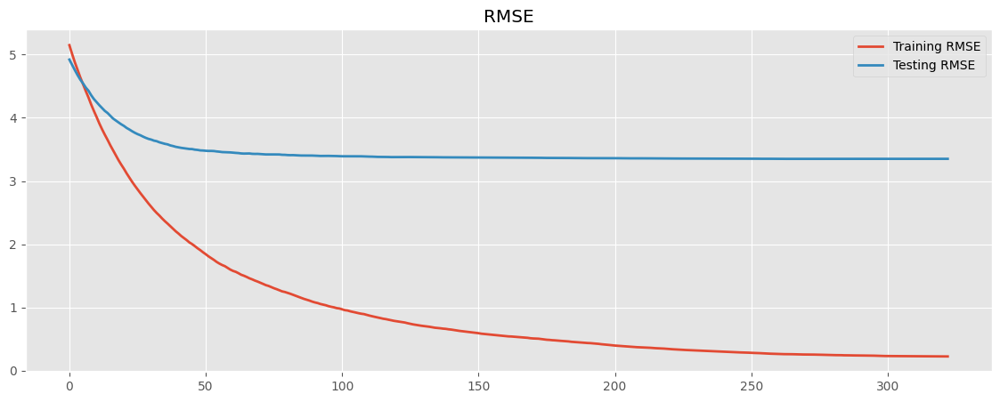

In [26]:
plot_history(model)

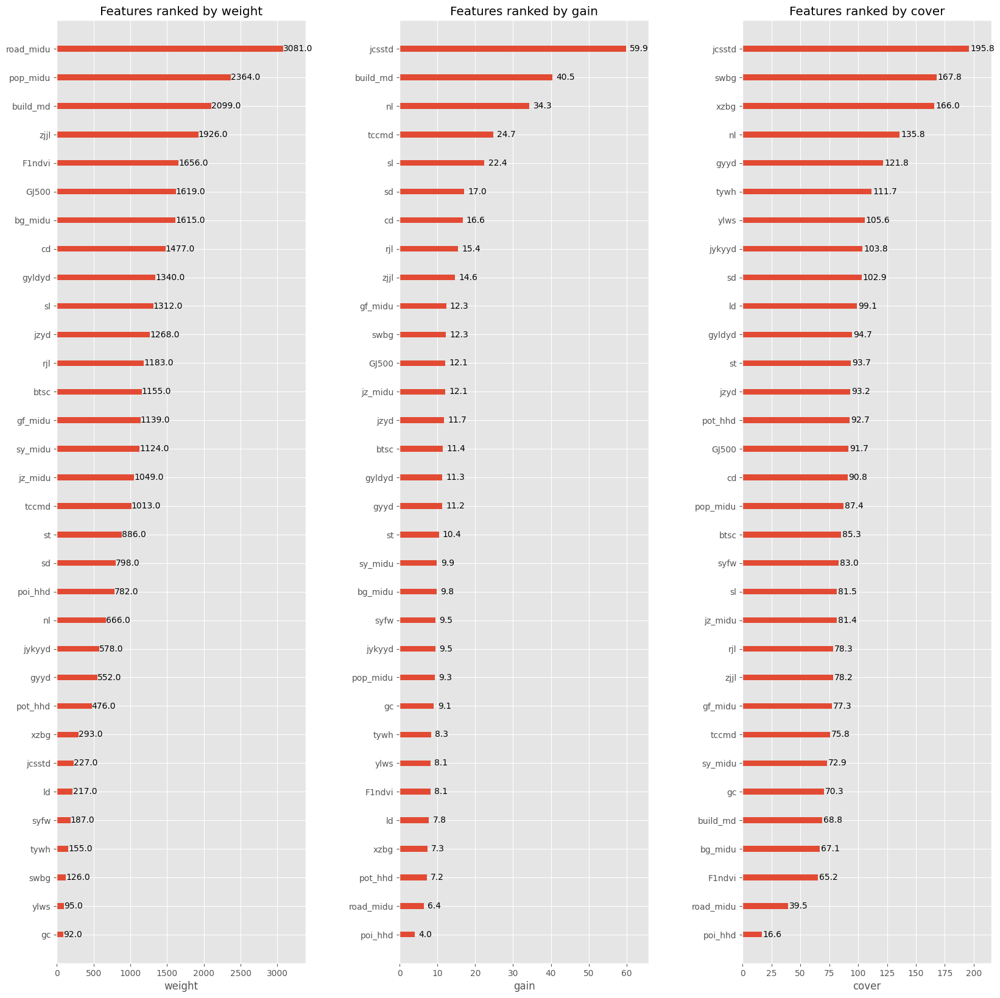

In [27]:
plot_importance(model)

In [28]:
import shap

In [29]:
cols = ['poi_hhd', 'road_midu', 'build_md','pop_midu','rjl','bg_midu','gf_midu','sy_midu','jz_midu','tccmd','F1ndvi','GJ500','zjjl',"jcsstd","gyldyd","gyyd","jykyyd","jzyd","swbg","syfw","tywh","xzbg","ylws","jtczyd","nl","sl","cd","gc","sd","st","btsc","ld",'pot_hhd',]

In [30]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(data[cols])
print(shap_values.shape)
np.savetxt('shap values.csv', shap_values, delimiter = ',') 
y_base = explainer.expected_value
print(y_base)
data['pred'] = model.predict(data[cols])
print(data['pred'].mean())

[10:30:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


(2384, 33)
33.80676
33.76183


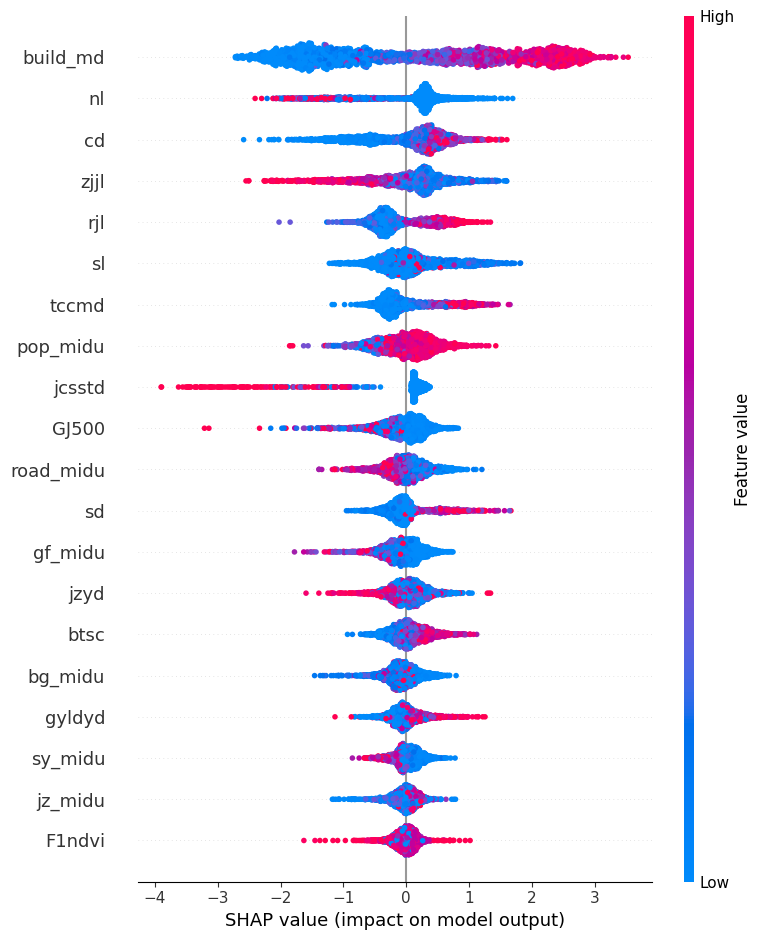

In [31]:
shap.summary_plot(shap_values, data[cols])

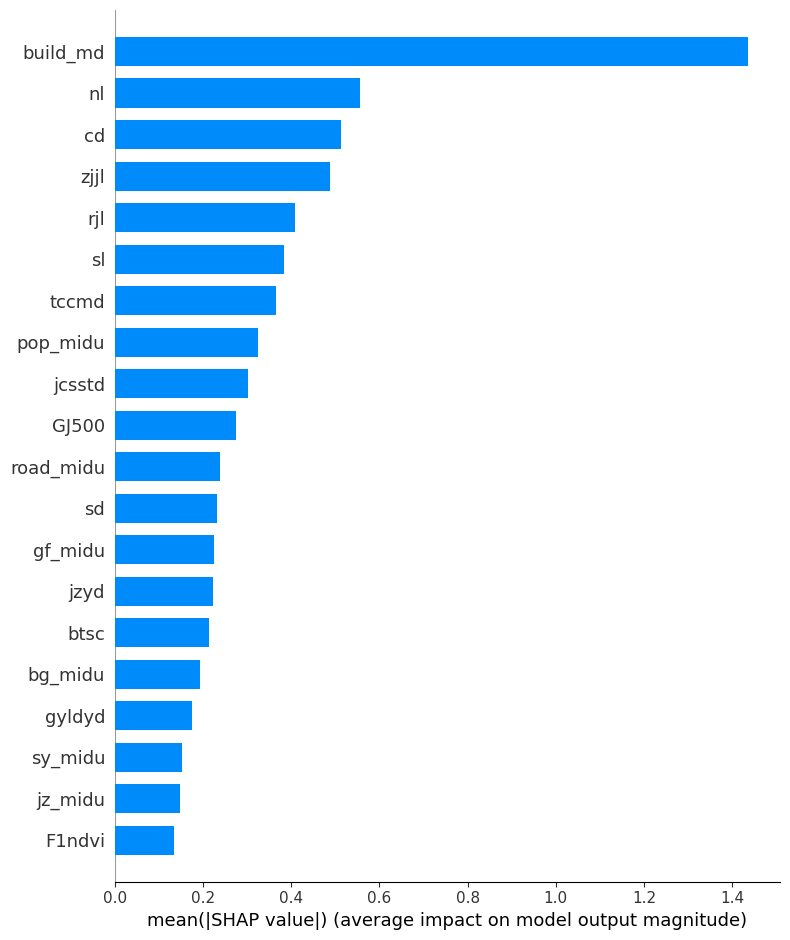

In [32]:
shap.summary_plot(shap_values, data[cols], plot_type="bar")

In [33]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(data[cols])

[10:31:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


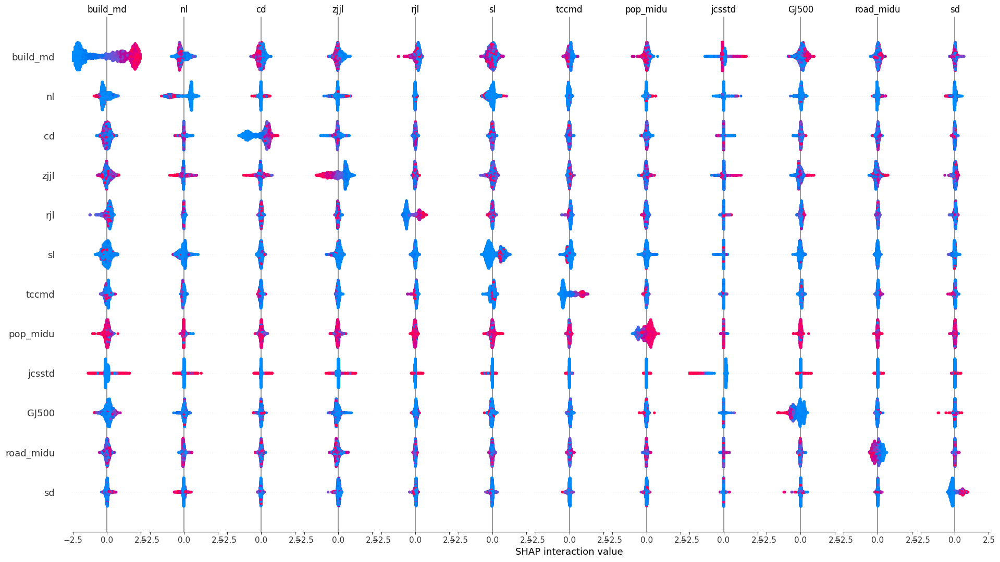

In [34]:
shap.summary_plot(shap_interaction_values, data[cols], max_display=12)

In [35]:
plt.rcParams['font.size'] = 14
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'Times New Roman'

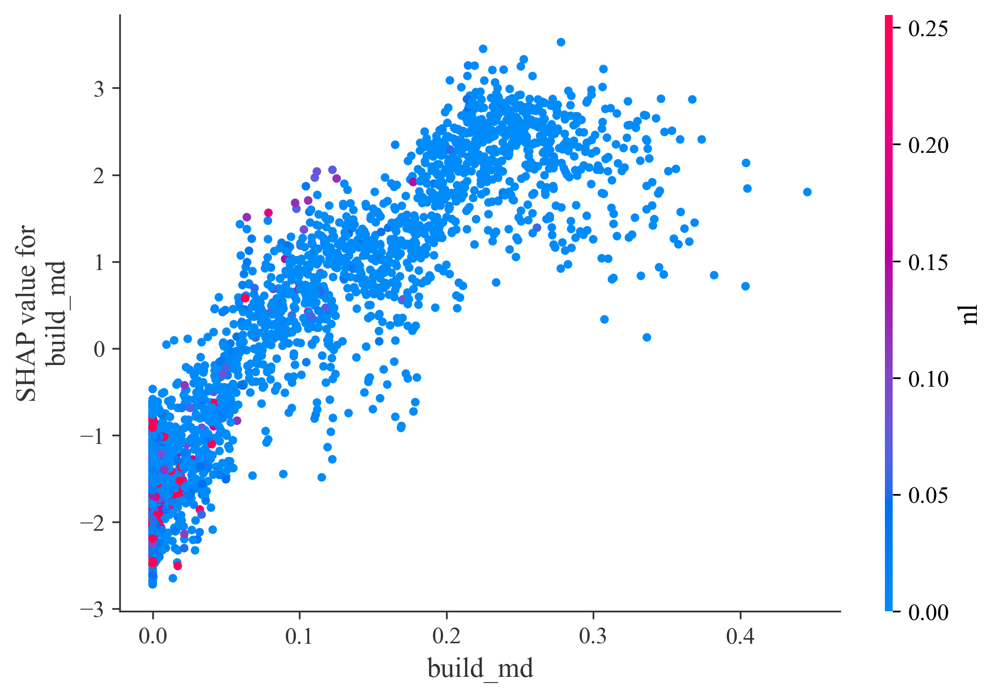

In [36]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='nl', show=False)

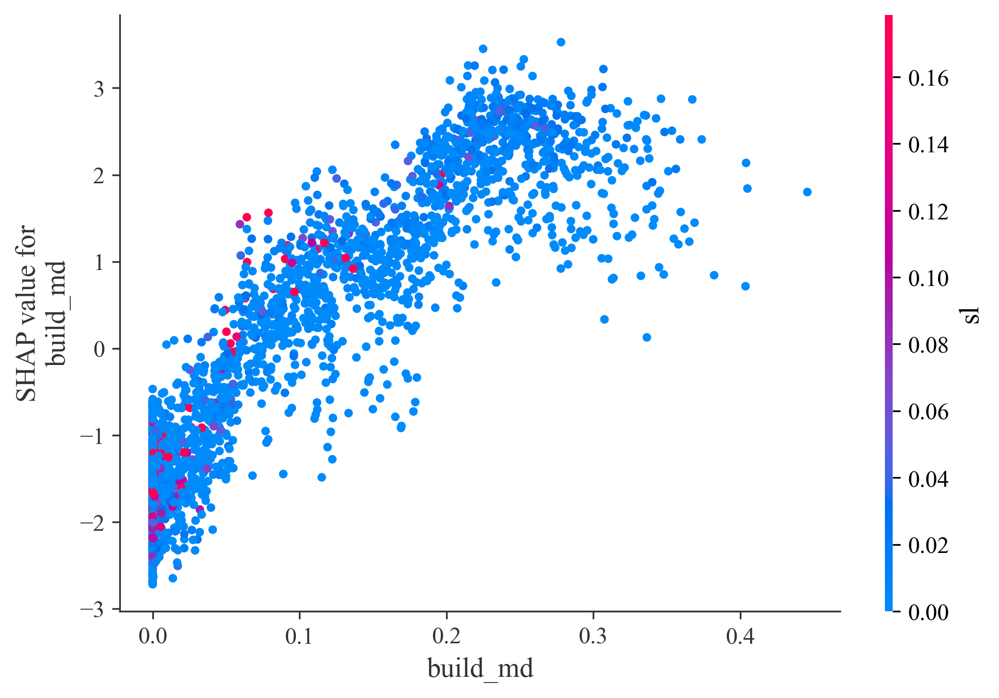

In [46]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='sl', show=False)

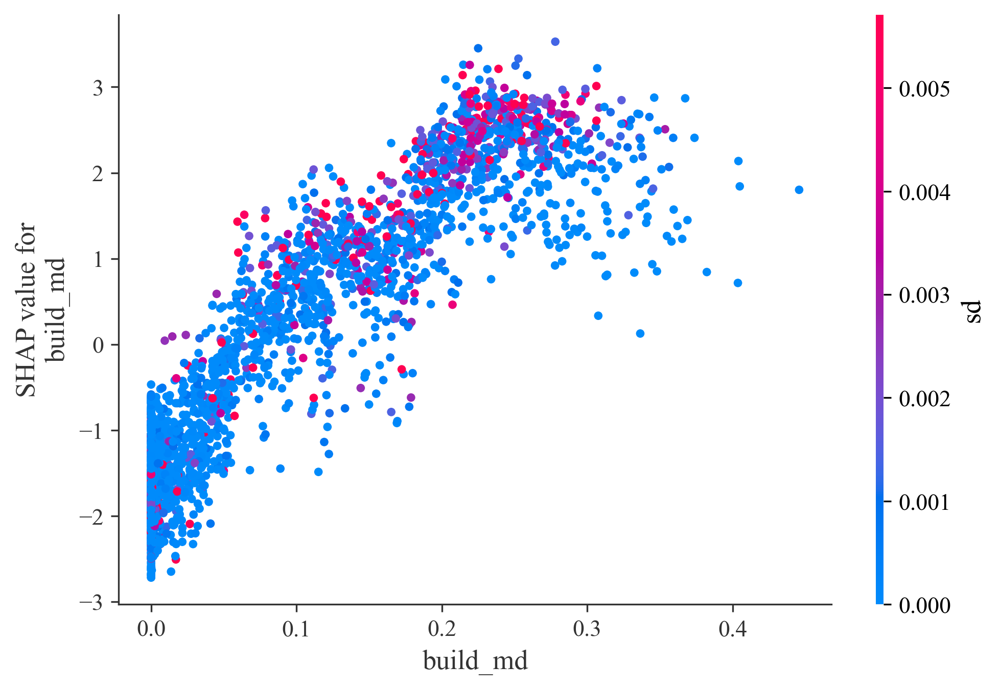

In [47]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='sd', show=False)

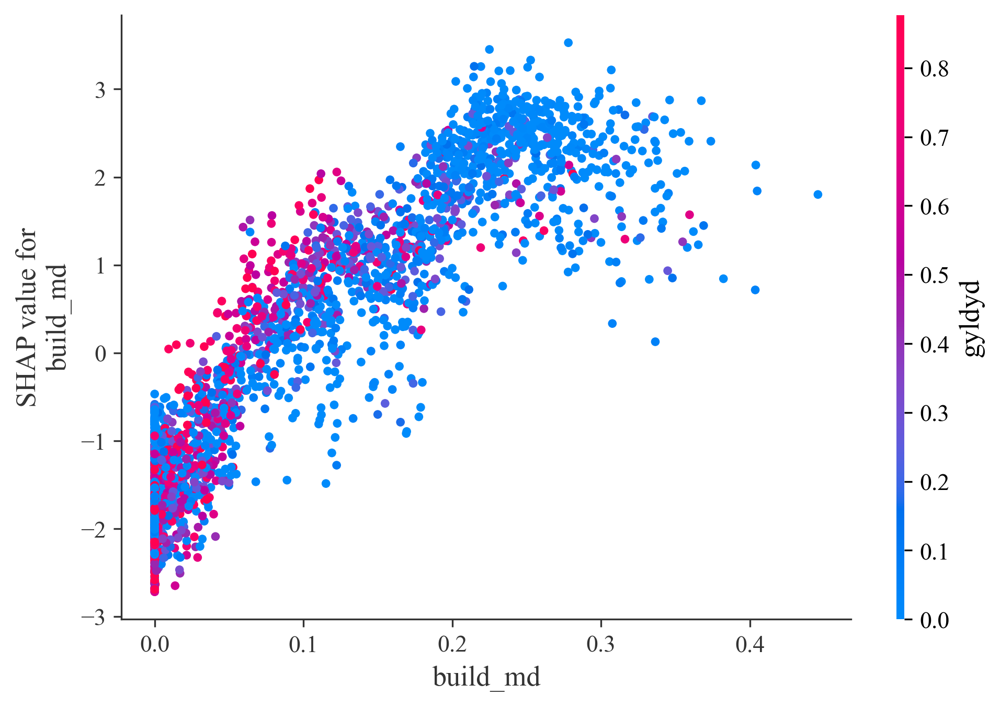

In [48]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='gyldyd', show=False)

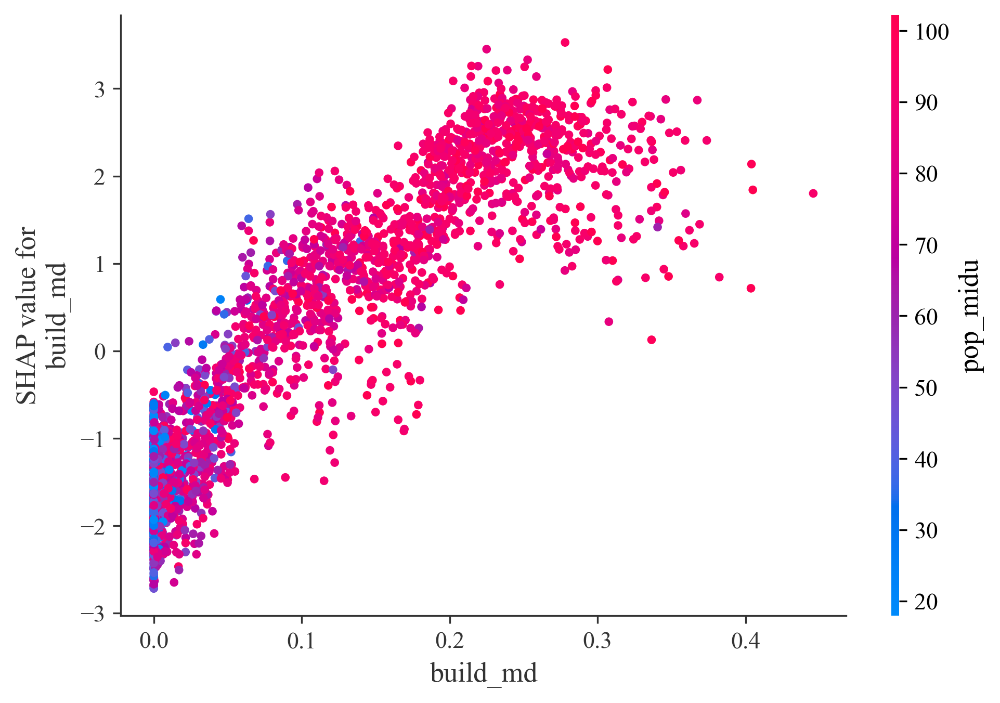

In [49]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='pop_midu', show=False)

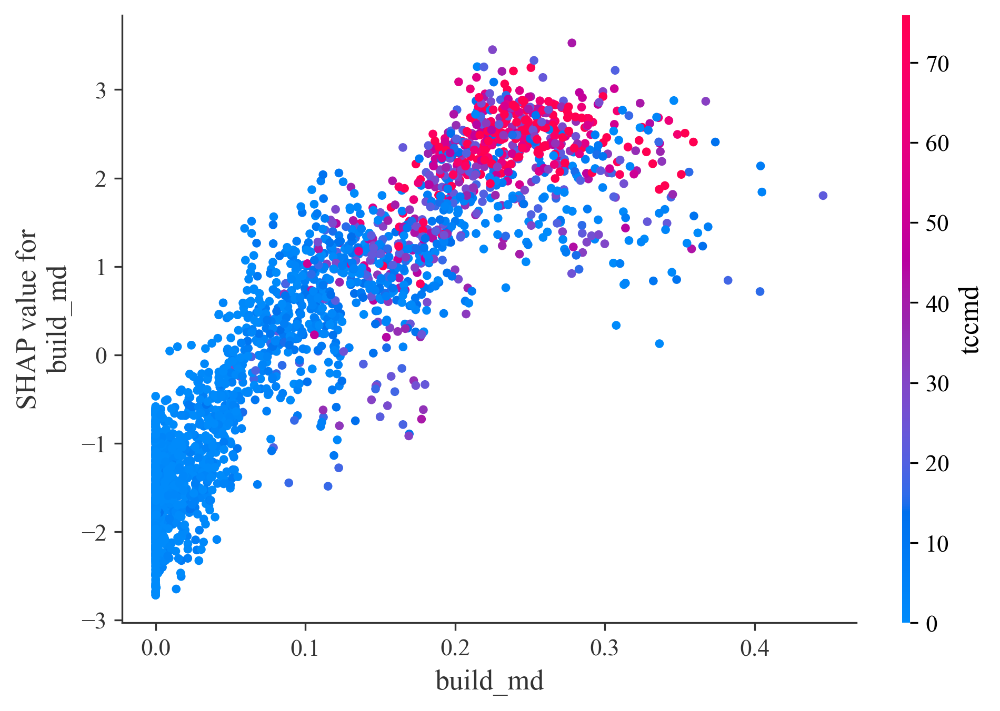

In [50]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='tccmd', show=False)

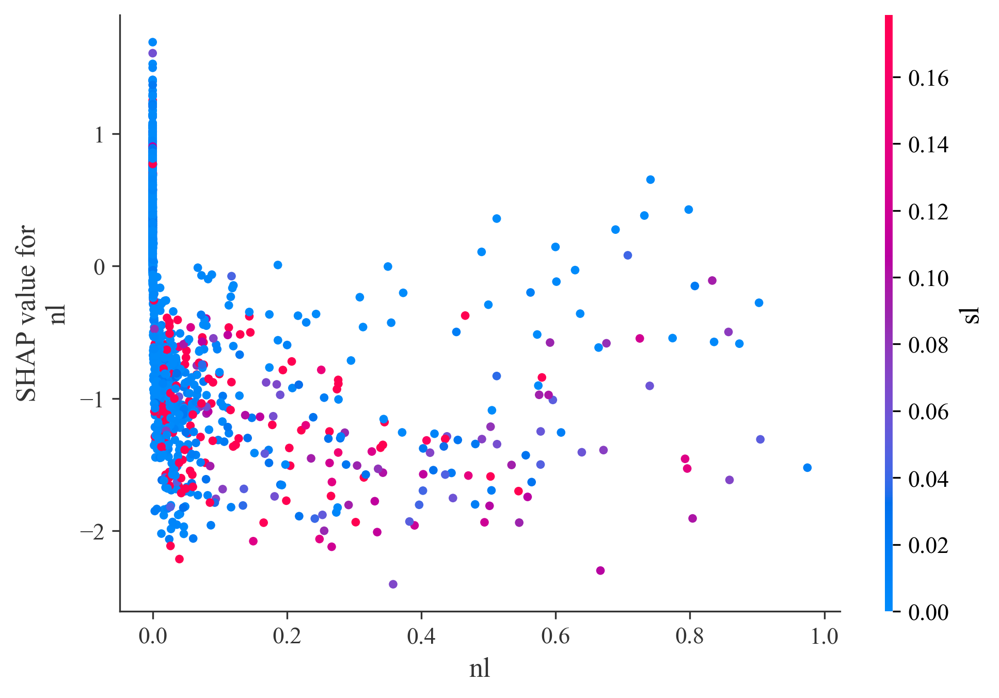

In [51]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='sl', show=False)

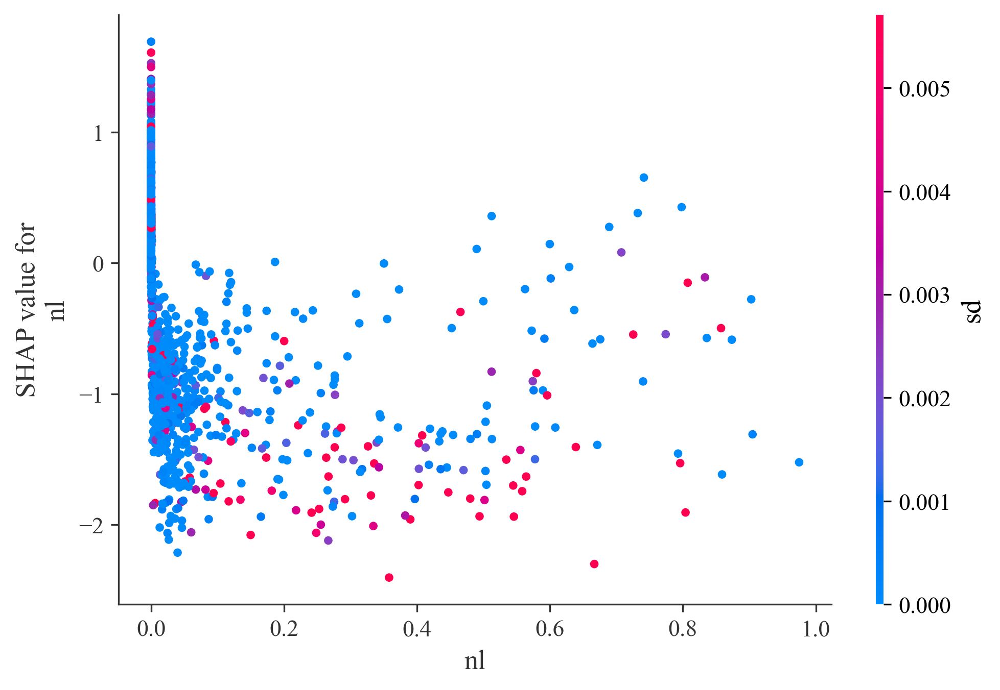

In [52]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='sd', show=False)

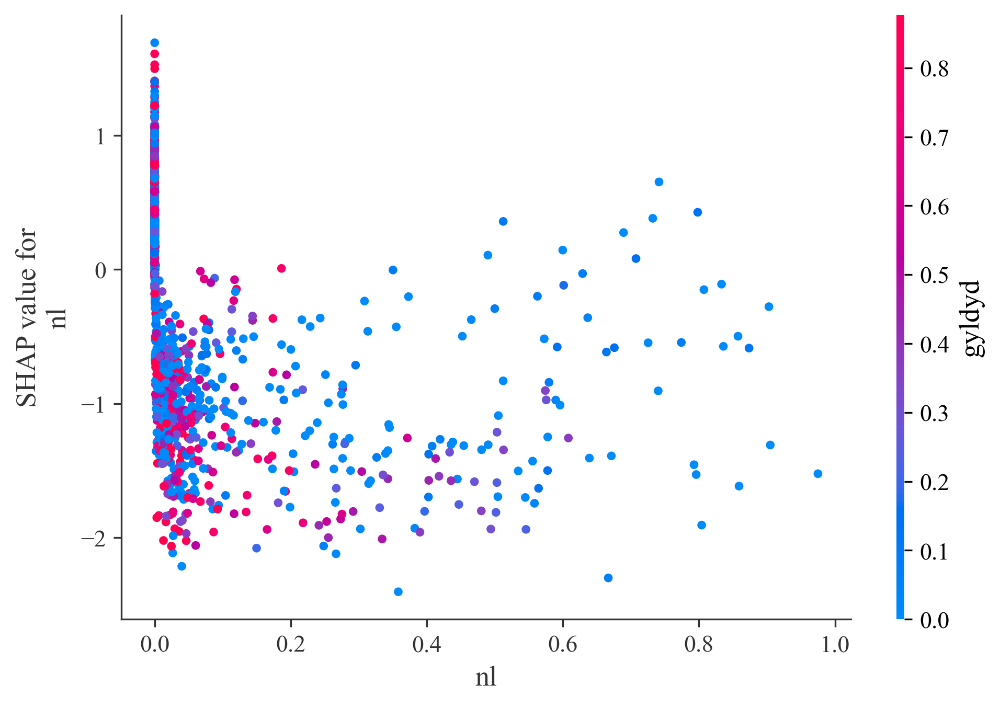

In [53]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='gyldyd', show=False)

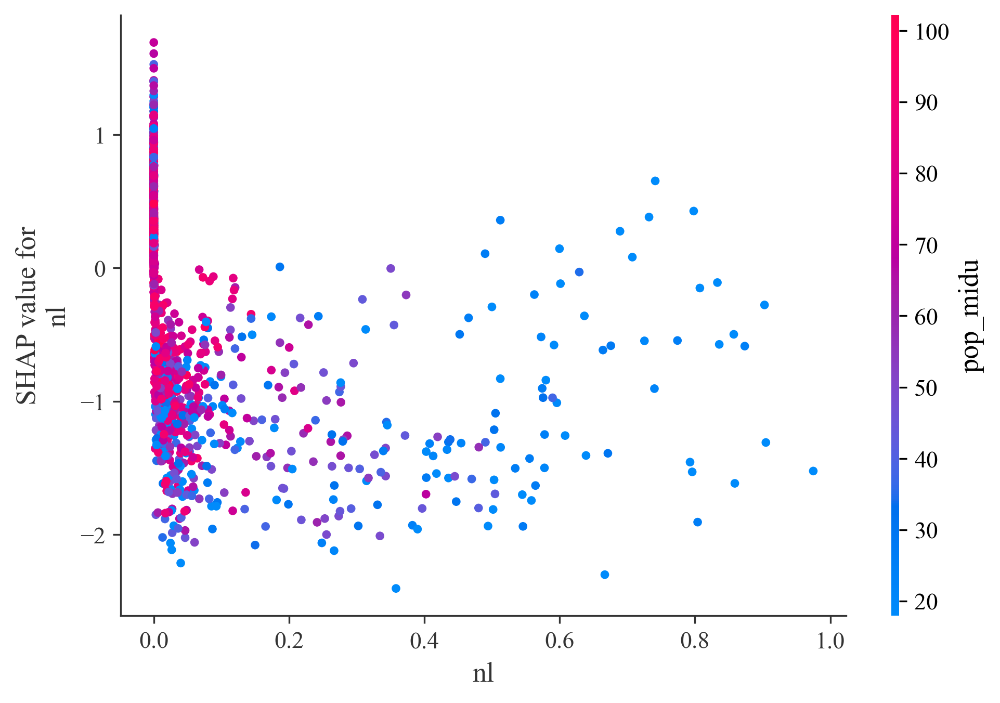

In [54]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='pop_midu', show=False)

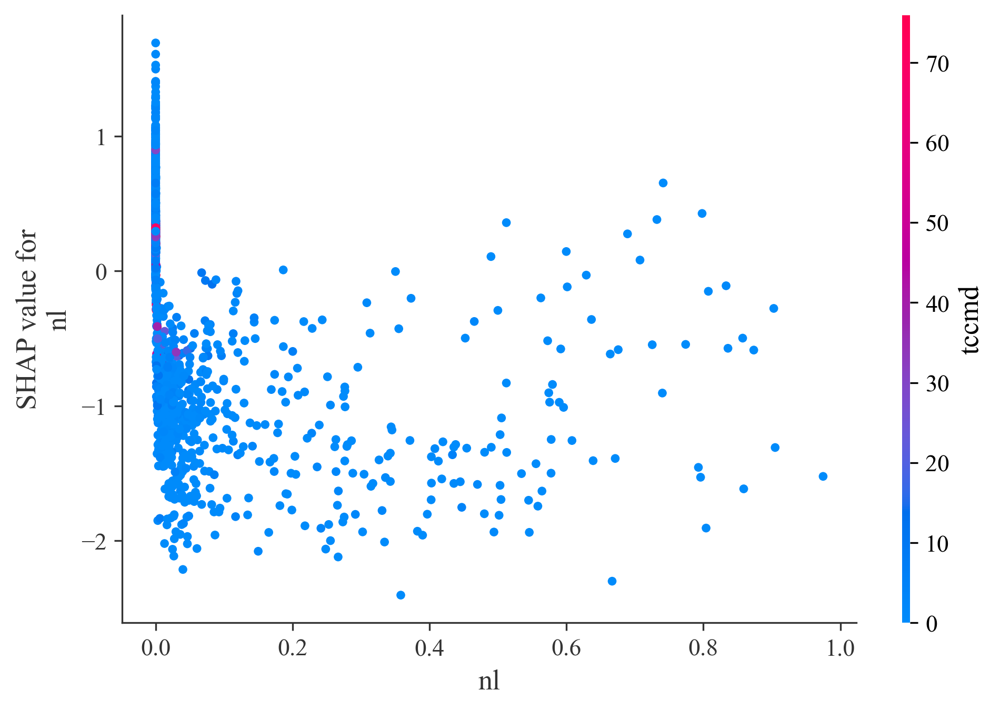

In [55]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='tccmd', show=False)

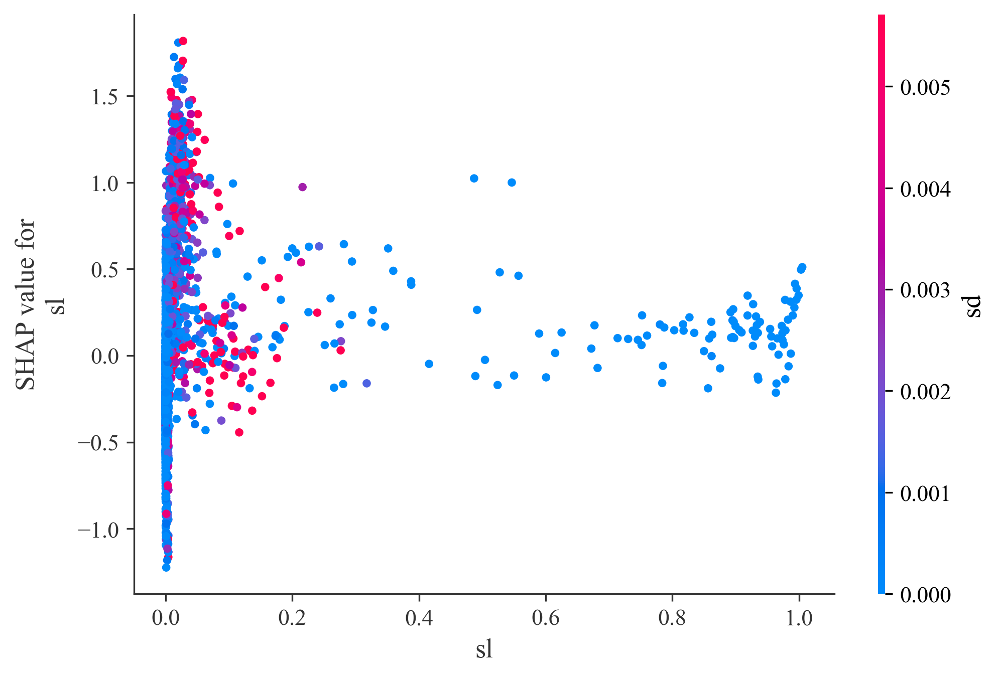

In [56]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='sd', show=False)

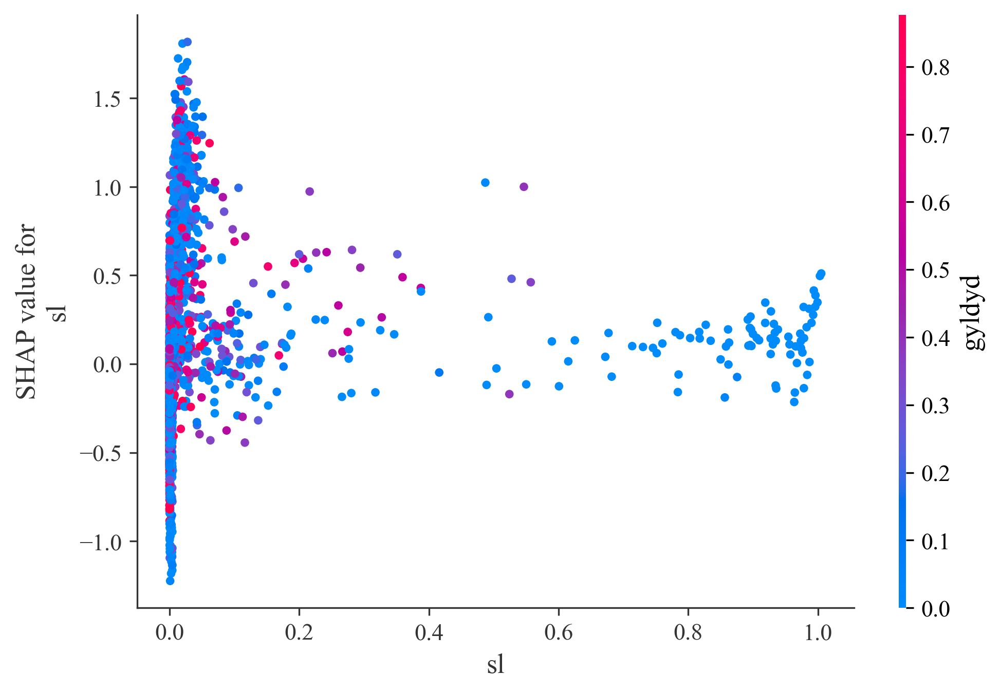

In [57]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='gyldyd', show=False)

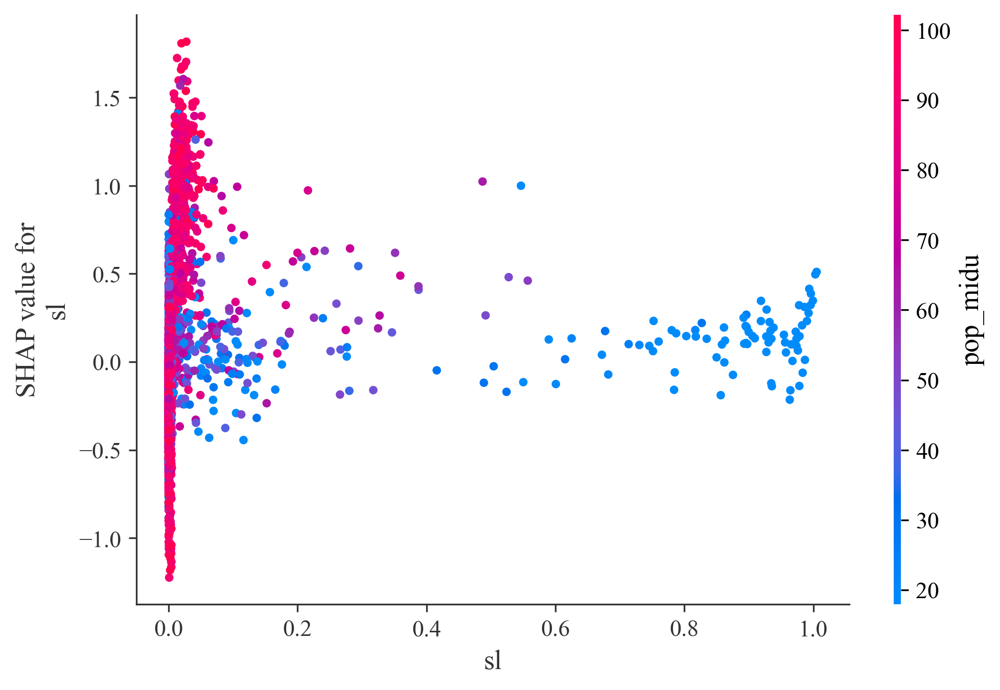

In [58]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='pop_midu', show=False)

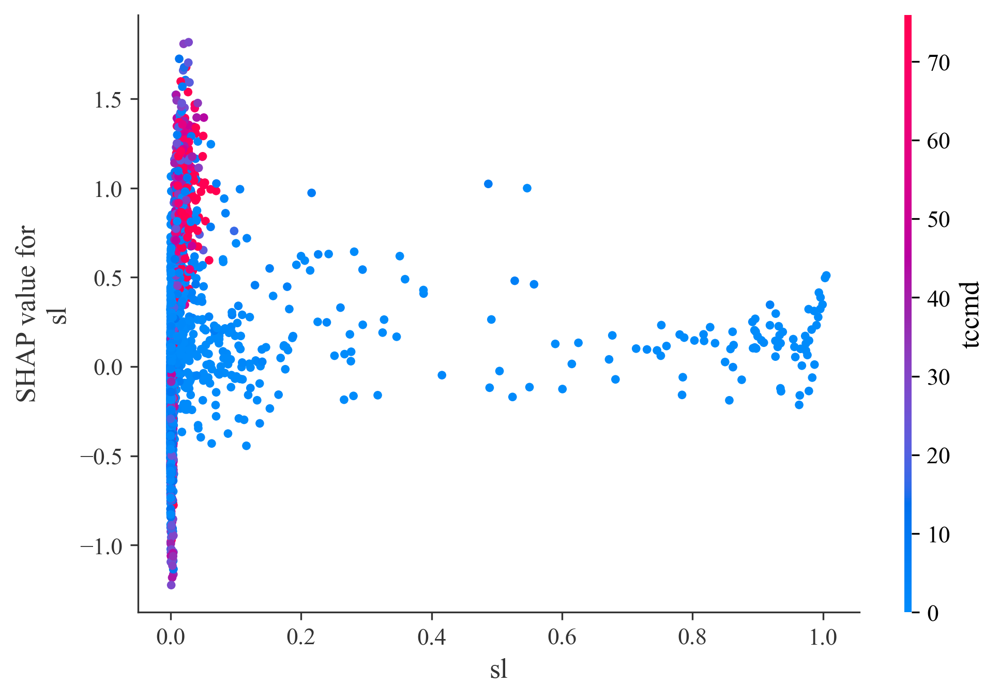

In [59]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='tccmd', show=False)

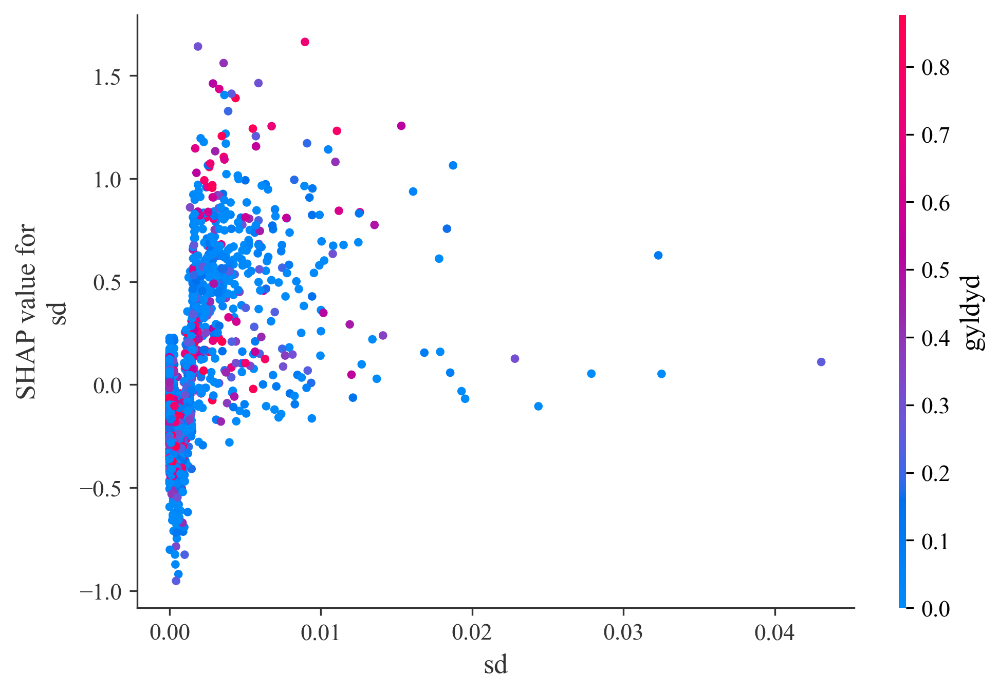

In [60]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='gyldyd', show=False)

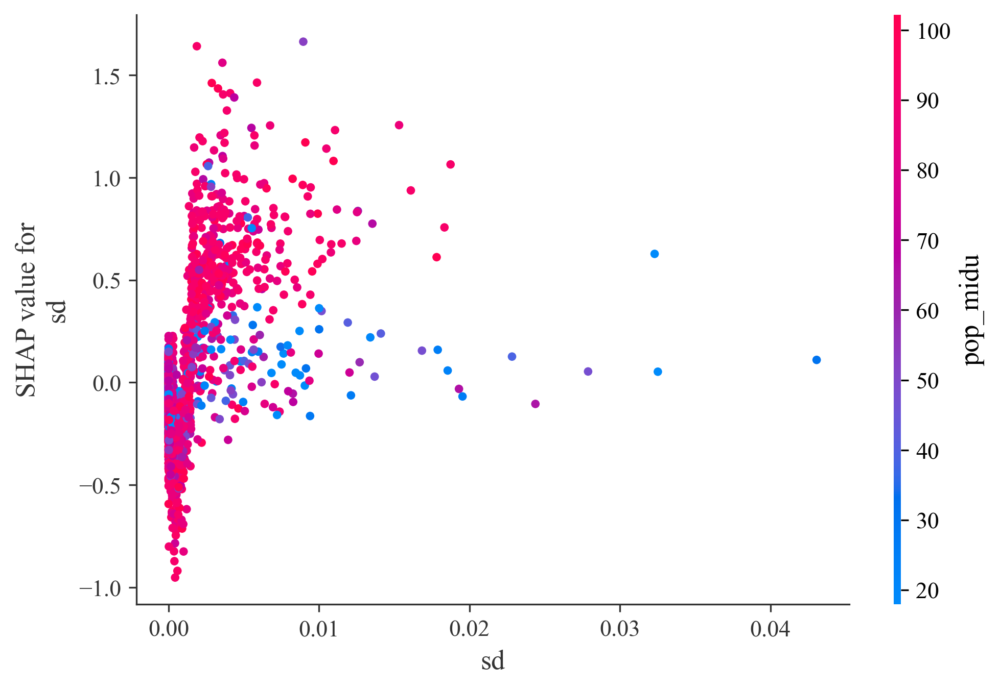

In [61]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='pop_midu', show=False)

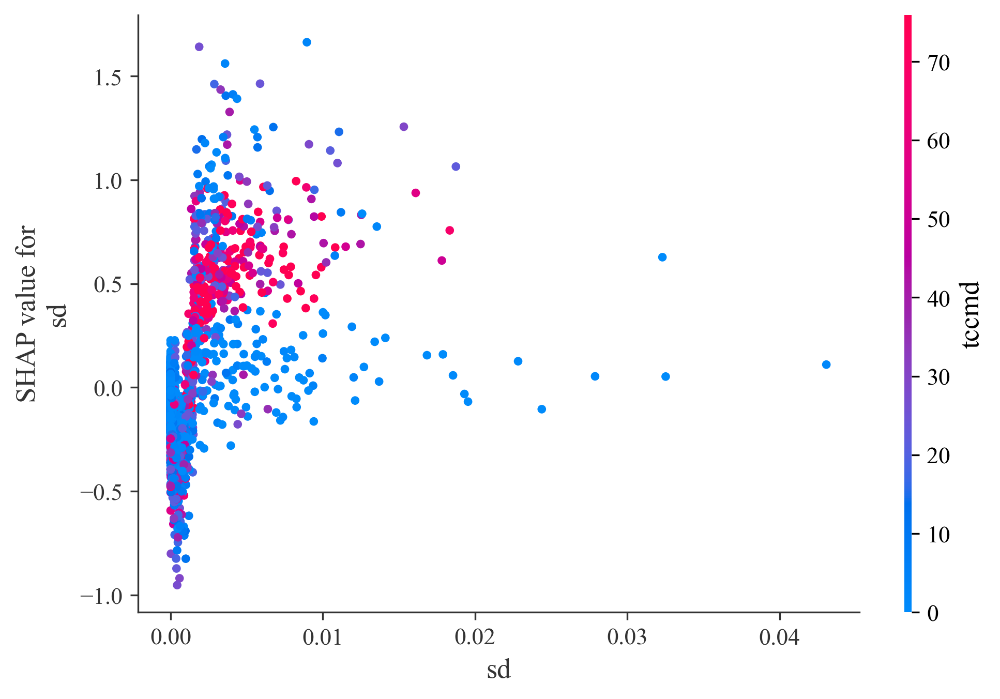

In [62]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='tccmd', show=False)

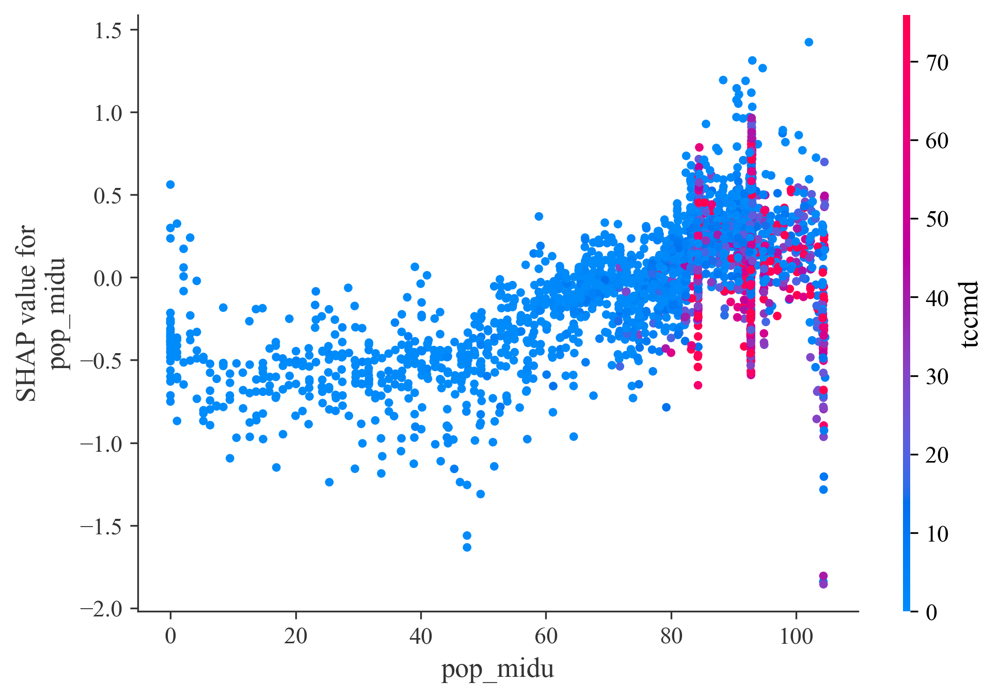

In [63]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('pop_midu', shap_values, data[cols], interaction_index='tccmd', show=False)

# PDP

In [64]:
from pdpbox import pdp
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag,figsize=(20,16))

You selected build_md


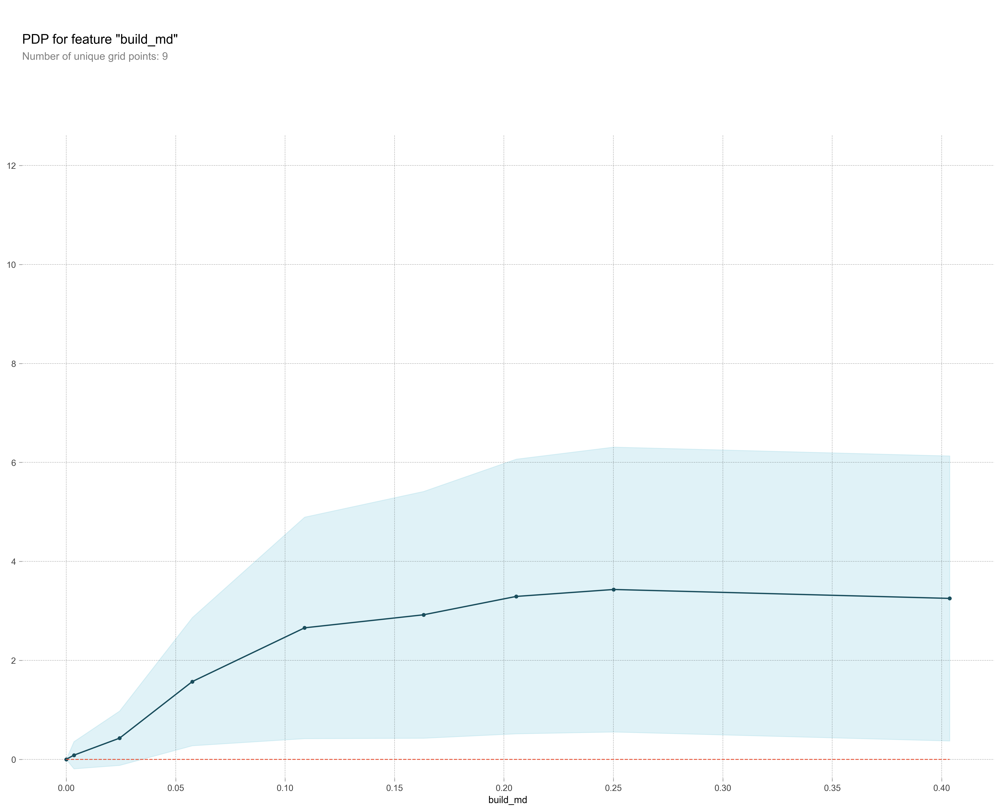

In [38]:
#@title Select a predictor to analyse Linear Regression Model. { run: "auto" }

selected_predictor = "build_md" #@param ['Age_08_04', 'KM', 'HP', 'Met_Color', 'Automatic', 'cc', 'Doors', 'Weight']
print('You selected', selected_predictor)
plot_pdp(model, X_train, selected_predictor)

In [39]:
from pdpbox import pdp
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag, figsize=(20,16))

You selected nl


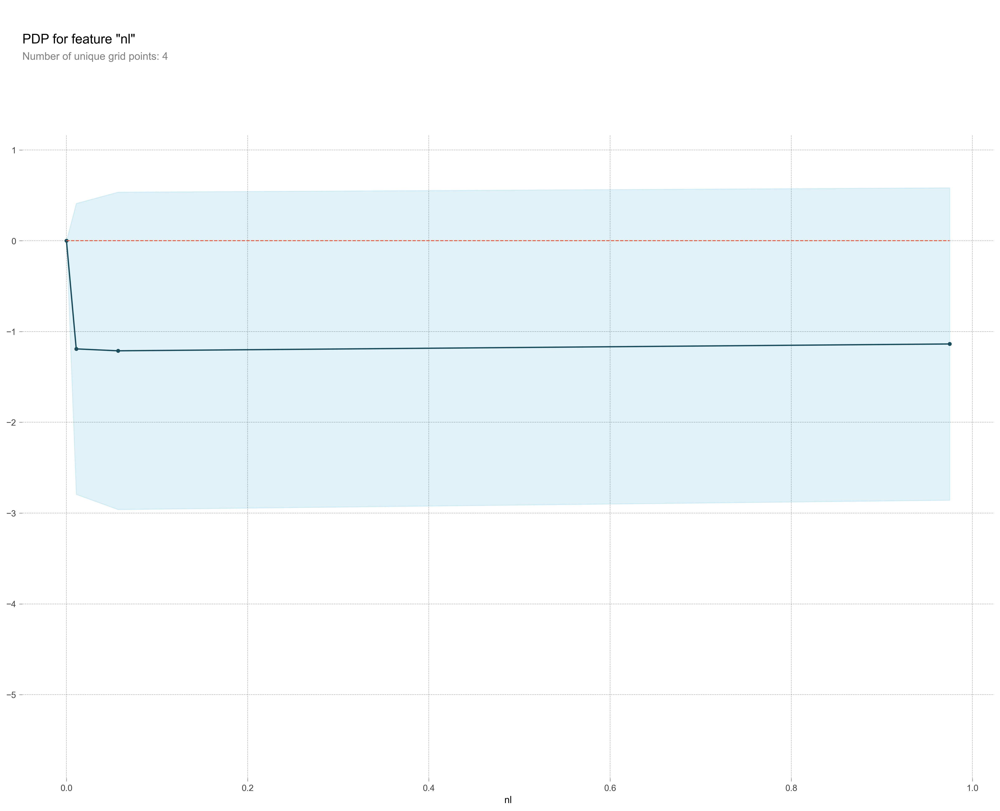

In [40]:
selected_predictor = 'nl'
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected sl


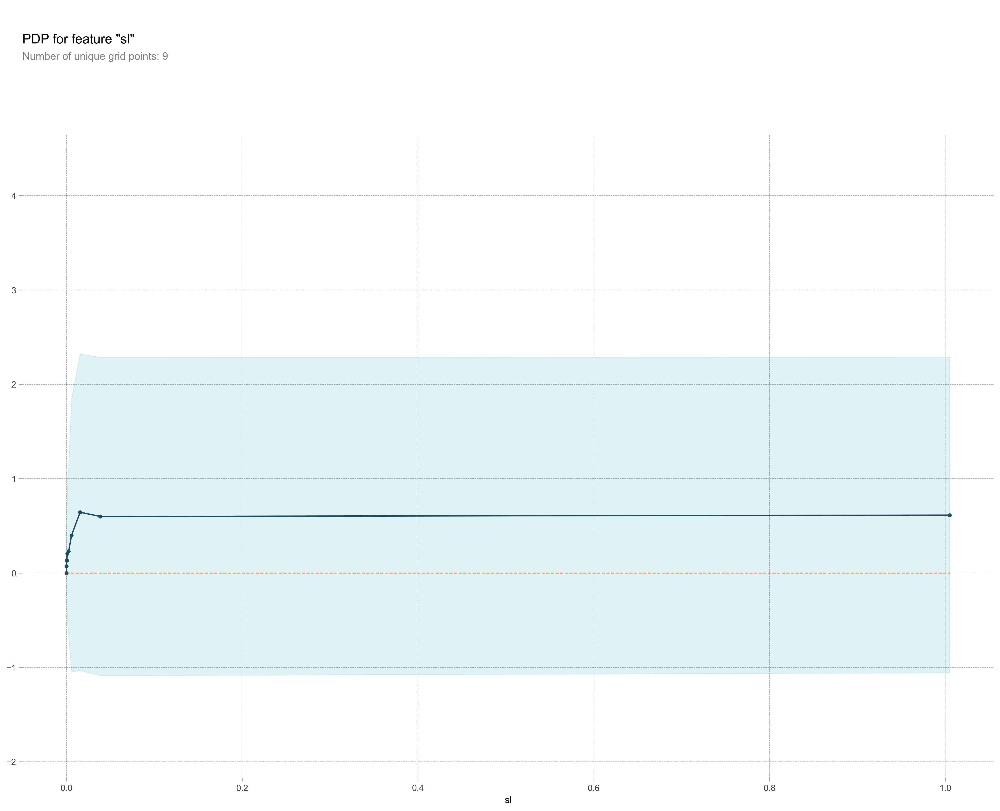

In [41]:
selected_predictor = "sl" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected sd


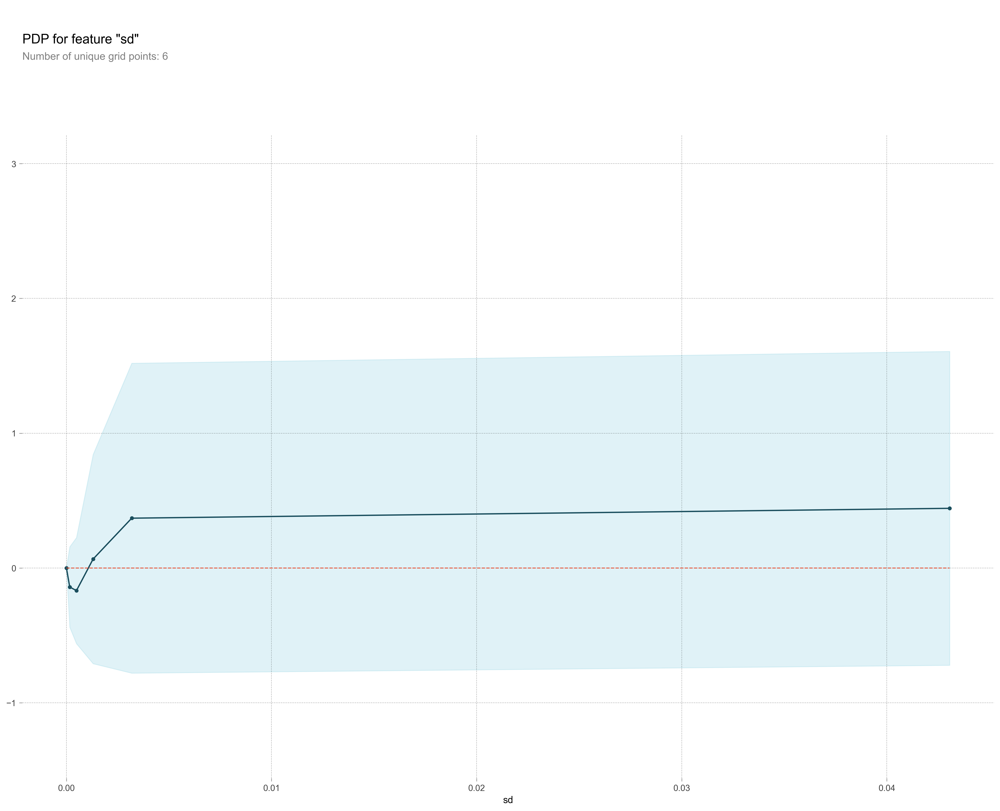

In [42]:
selected_predictor = "sd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected gyldyd


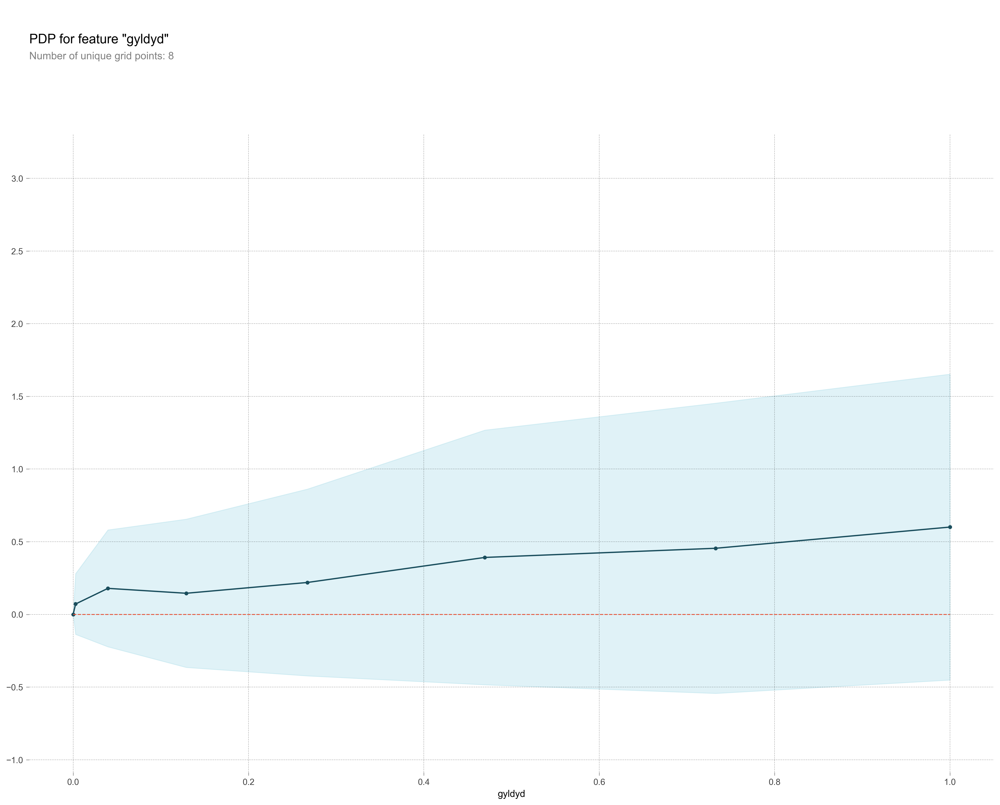

In [43]:
selected_predictor = "gyldyd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected pop_midu


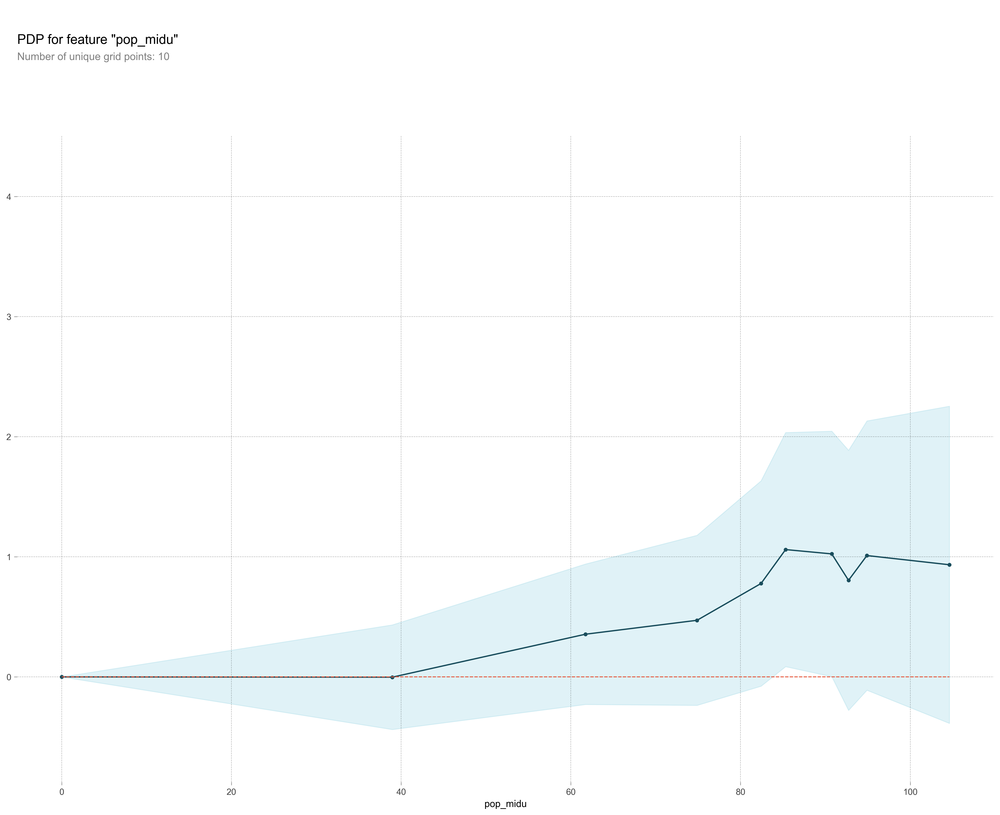

In [44]:
selected_predictor = "pop_midu" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected tccmd


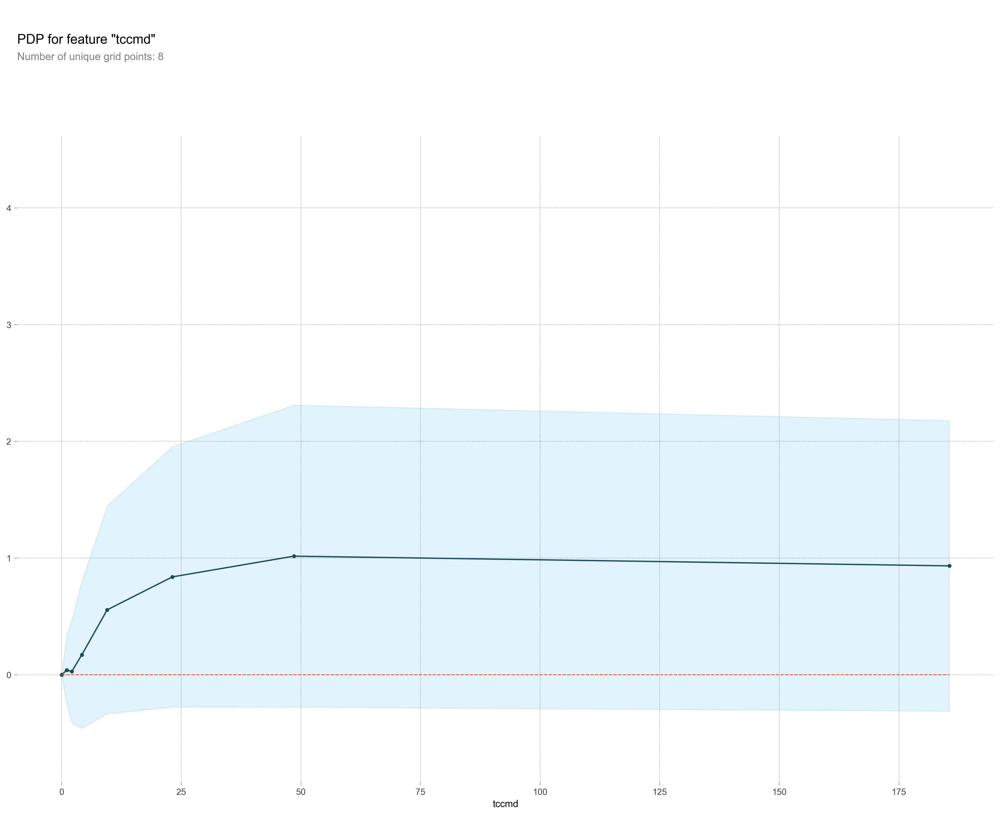

In [45]:
selected_predictor = "tccmd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)